Images: 250
Masks : 250
Image paths: 250
Mask paths : 250
Data length: 250
Sample data: [('/kaggle/input/datasets/tashinayak/isles-dataset-lesion/working/sub-strokecase0202/registered/anat_registered_to_dwi.nii', '/kaggle/input/datasets/tashinayak/isles-dataset-lesion/working/sub-strokecase0202/registered/mask_registered_to_dwi.nii'), ('/kaggle/input/datasets/tashinayak/isles-dataset-lesion/working/sub-strokecase0242/registered/anat_registered_to_dwi.nii', '/kaggle/input/datasets/tashinayak/isles-dataset-lesion/working/sub-strokecase0242/registered/mask_registered_to_dwi.nii')]
Type: <class 'list'>
Total pairs: 250
Train: 200
Val: 25
Test: 25
Epoch 1: Train=0.7182, Val=0.7060
Epoch 2: Train=0.6981, Val=0.6946
Epoch 3: Train=0.6898, Val=0.6730
Epoch 4: Train=0.6847, Val=0.6595
Epoch 5: Train=0.6875, Val=0.6863
Epoch 6: Train=0.6868, Val=0.6799
Epoch 7: Train=0.6857, Val=0.6587
Epoch 8: Train=0.6822, Val=0.6963
Epoch 9: Train=0.6766, Val=0.6573
Epoch 10: Train=0.6798, Val=0.6604
Epoch 11

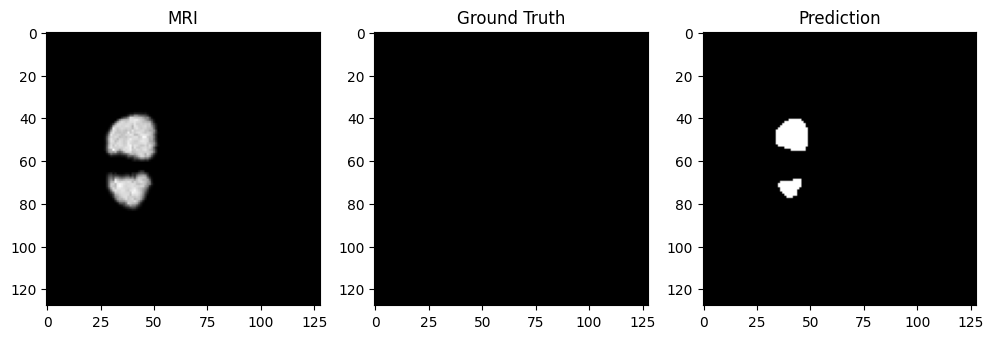

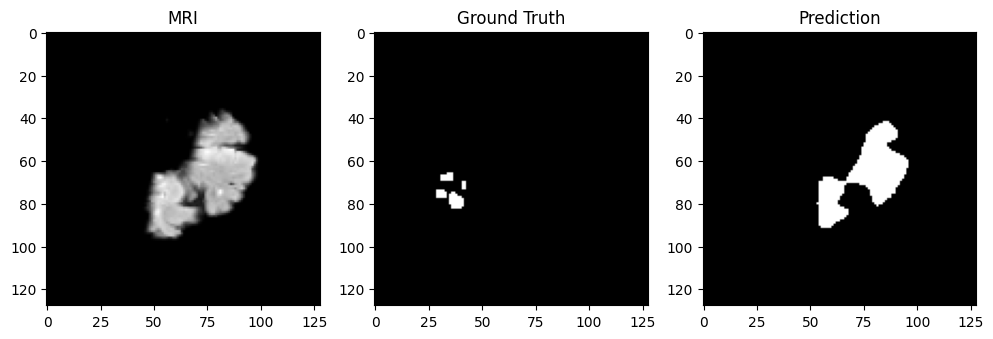

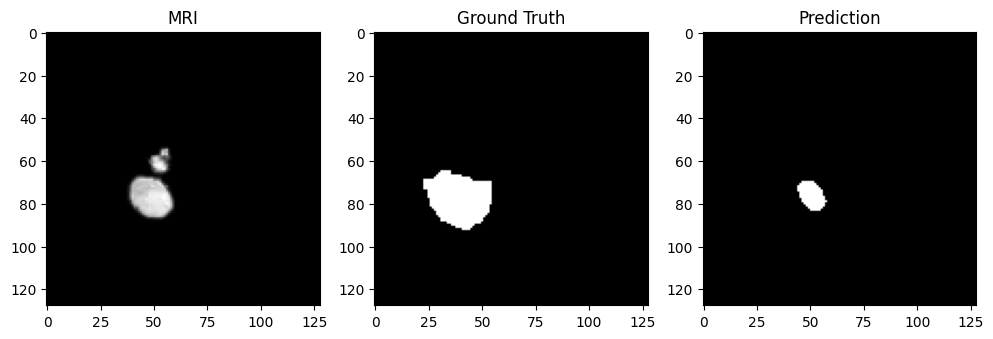

In [15]:
import numpy as np
import cv2
import nibabel as nib
from glob import glob
import os
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

import os
from sklearn.model_selection import train_test_split

base_dir = "/kaggle/input/datasets/tashinayak/isles-dataset-set/working"

image_paths = []
mask_paths = []

for case in os.listdir(base_dir):
    case_path = os.path.join(base_dir, case, "registered")
    
    if os.path.exists(case_path):
        image_file = os.path.join(case_path, "anat_registered_to_dwi.nii")
        mask_file  = os.path.join(case_path, "mask_registered_to_dwi.nii")
        
        if os.path.exists(image_file) and os.path.exists(mask_file):
            image_paths.append(image_file)
            mask_paths.append(mask_file)

print("Images:", len(image_paths))
print("Masks :", len(mask_paths))


IMG_SIZE = 128
BATCH_SIZE = 4
EPOCHS = 20
DATA_PATH = "/kaggle/input/ISLES--dataset-set"
all_files = glob(DATA_PATH + "/*.nii.gz")

data = list(zip(image_paths, mask_paths))
# Pair them
train_data, temp_data = train_test_split(
    data, test_size=0.2, random_state=42
)

val_data, test_data = train_test_split(
    temp_data, test_size=0.5, random_state=42
)
print("Image paths:", len(image_paths))
print("Mask paths :", len(mask_paths))

print("Data length:", len(data))
print("Sample data:", data[:2])
print("Type:", type(data))

data = list(zip(image_paths, mask_paths))
print("Total pairs:", len(data)) 
# Safety check
if len(data) == 0:
    raise ValueError("No data found. Check directory path!")
print("Train:", len(train_data))
print("Val:", len(val_data))
print("Test:", len(test_data))
class ISLESDataset(Dataset):
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, mask_path = self.data[idx]

        img_vol = nib.load(img_path).get_fdata()
        mask_vol = nib.load(mask_path).get_fdata()

        # random slice
        i = np.random.randint(0, img_vol.shape[2])

        img = img_vol[:, :, i]
        mask = mask_vol[:, :, i]

        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE))

        # normalize
        if np.max(img) != 0:
            img = img / np.max(img)

        # binarize mask
        mask = (mask > 0).astype(np.float32)

        img = torch.tensor(img, dtype=torch.float32).unsqueeze(0)
        mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)

        return img, mask
train_loader = DataLoader(ISLESDataset(train_data), batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(ISLESDataset(val_data), batch_size=BATCH_SIZE, shuffle=False)
test_loader  = DataLoader(ISLESDataset(test_data), batch_size=BATCH_SIZE, shuffle=False)
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        def block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.ReLU(),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.ReLU()
            )

        self.enc1 = block(1, 64)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = block(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.bottleneck = block(128, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = block(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = block(128, 64)

        self.out = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))

        b = self.bottleneck(self.pool2(e2))

        d2 = self.up2(b)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        return torch.sigmoid(self.out(d1))
def dice_loss(pred, target, smooth=1e-6):
    pred = pred.view(-1)
    target = target.view(-1)

    intersection = (pred * target).sum()
    return 1 - (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)


class FocalLoss(nn.Module):
    def __init__(self, alpha=0.8, gamma=2):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets):
        bce = F.binary_cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-bce)
        return (self.alpha * (1 - pt) ** self.gamma * bce).mean()
model = UNet().to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
focal_loss = FocalLoss()

best_val_loss = float('inf')

for epoch in range(EPOCHS):

    model.train()
    train_loss = 0

    for imgs, masks in train_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)

        preds = model(imgs)

        loss = 0.7 * dice_loss(preds, masks) + 0.3 * focal_loss(preds, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    train_loss /= len(train_loader)

    # VALIDATION
    model.eval()
    val_loss = 0

    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)

            preds = model(imgs)
            loss = 0.7 * dice_loss(preds, masks) + 0.3 * focal_loss(preds, masks)

            val_loss += loss.item()

    val_loss /= len(val_loader)

    print(f"Epoch {epoch+1}: Train={train_loss:.4f}, Val={val_loss:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_model.pth")
model.load_state_dict(torch.load("best_model.pth"))
model.eval()

dice_scores = []

with torch.no_grad():
    for imgs, masks in test_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)

        preds = model(imgs)
        preds_bin = (preds > 0.3).float()

        intersection = (preds_bin * masks).sum(dim=[1,2,3])
        dice = (2 * intersection) / (preds_bin.sum(dim=[1,2,3]) + masks.sum(dim=[1,2,3]) + 1e-6)

        dice_scores.extend(dice.cpu().numpy())

print("Average Dice:", np.mean(dice_scores))
imgs, masks = next(iter(test_loader))
imgs = imgs.to(DEVICE)

with torch.no_grad():
    preds = model(imgs)

preds = preds.cpu().numpy()
imgs = imgs.cpu().numpy()
masks = masks.numpy()

for i in range(3):
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.title("MRI")
    plt.imshow(imgs[i][0], cmap='gray')

    plt.subplot(1,3,2)
    plt.title("Ground Truth")
    plt.imshow(masks[i][0], cmap='gray')

    plt.subplot(1,3,3)
    plt.title("Prediction")
    plt.imshow(preds[i][0] > 0.3, cmap='gray')

    plt.show()

In [4]:
print(os.listdir("/kaggle/input/datasets/tashinayak/isles-dataset-lesion"))

['working']


In [2]:
import os
import torch
from torch.utils.data import Dataset
import cv2
import numpy as np

class StrokeDataset(Dataset):
    def __init__(self, root_dir, img_size=256):
        self.paths = []
        self.img_size = img_size

        for case in os.listdir(root_dir):
            case_path = os.path.join(root_dir, case)
            if os.path.isdir(case_path):
                img_path = None
                mask_path = None

                for file in os.listdir(case_path):
                    if "image" in file.lower():
                        img_path = os.path.join(case_path, file)
                    elif "mask" in file.lower():
                        mask_path = os.path.join(case_path, file)

                if img_path and mask_path:
                    self.paths.append((img_path, mask_path))

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img_path, mask_path = self.paths[idx]

        img = cv2.imread(img_path, 0)
        mask = cv2.imread(mask_path, 0)

        img = cv2.resize(img, (self.img_size, self.img_size))
        mask = cv2.resize(mask, (self.img_size, self.img_size))

        img = img / 255.0
        mask = (mask > 0).astype(np.float32)

        img = torch.tensor(img).unsqueeze(0).float()
        mask = torch.tensor(mask).unsqueeze(0).float()

        return img, mask
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        def block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.ReLU(),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.ReLU()
            )

        self.enc1 = block(1, 64)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = block(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.bottleneck = block(128, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = block(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = block(128, 64)

        self.final = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))

        b = self.bottleneck(self.pool2(e2))

        d2 = self.up2(b)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))

        d1 = self.up1(d2)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))

        return torch.sigmoid(self.final(d1))
def dice_loss(pred, target, smooth=1):
    pred = pred.view(-1)
    target = target.view(-1)

    intersection = (pred * target).sum()
    return 1 - (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)


def focal_loss(pred, target, alpha=0.8, gamma=2):
    bce = nn.BCELoss()(pred, target)
    pt = torch.exp(-bce)
    return alpha * (1 - pt) ** gamma * bce


def combined_loss(pred, target):
    return dice_loss(pred, target) + focal_loss(pred, target)
from torch.utils.data import DataLoader

dataset = StrokeDataset("isles_dataset_set")
loader = DataLoader(dataset, batch_size=4, shuffle=True)

model = UNet().cuda()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

for epoch in range(10):
    model.train()
    total_loss = 0

    for img, mask in loader:
        img, mask = img.cuda(), mask.cuda()

        pred = model(img)
        loss = combined_loss(pred, mask)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {total_loss/len(loader):.4f}")
import matplotlib.pyplot as plt

model.eval()

img, mask = dataset[0]
img = img.unsqueeze(0).cuda()

with torch.no_grad():
    pred = model(img)[0][0].cpu().numpy()

img = img[0][0].cpu().numpy()
mask = mask[0].numpy()

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.title("Input Image")
plt.imshow(img, cmap="gray")

plt.subplot(1,3,2)
plt.title("Ground Truth")
plt.imshow(mask, cmap="gray")

plt.subplot(1,3,3)
plt.title("Prediction")
plt.imshow(pred > 0.5, cmap="gray")

plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'ISLES__dataset_lesion'

In [12]:
import os
print(os.listdir('/'))
os.listdir('/kaggle/input')

['bin', 'var', 'mnt', 'etc', 'root', 'home', 'tmp', 'lib', 'sbin', 'proc', 'lib64', 'srv', 'boot', 'opt', 'sys', 'media', 'lib32', 'usr', 'run', 'libx32', 'dev', 'kaggle', '.dockerenv', '.jupyter', 'requirements.txt', 'colab_requirements.txt', 'kaggle_requirements.txt', 'datalab', 'tools', 'content', 'python-apt', 'python-apt.tar.xz', 'NGC-DL-CONTAINER-LICENSE', 'cuda-keyring_1.1-1_all.deb']


['datasets']

In [14]:
import os
print(os.listdir('/kaggle'))
print(os.listdir('/kaggle/input'))

['lib', 'input', 'working']
['datasets']


In [6]:
import os
import numpy as np
import nibabel as nib
import cv2
import tensorflow as tf
from tensorflow.keras import layers, Model
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
IMG_SIZE = 128

import os

base_dir = "/kaggle/input/datasets/tashinayak/isles-dataset-set/working"

image_paths = []
mask_paths = []

import os

base_dir = "isles_dataset_set"

for case in os.listdir(base_dir):
    case_path = os.path.join(base_dir, case)

    # Check if it is a directory
    if os.path.isdir(case_path):

        img = os.path.join(case_path, f"{case}_anat_reg.nii")
        mask = os.path.join(case_path, f"{case}_mask_reg.nii")

        # Verify files exist
        if os.path.exists(img) and os.path.exists(mask):
            print("Image:", img)
            print("Mask :", mask)
    
def load_data(image_paths, mask_paths):
    X = []
    Y = []

    for img_p, mask_p in zip(image_paths, mask_paths):
        img = nib.load(img_p).get_fdata()
        mask = nib.load(mask_p).get_fdata()

        for i in range(img.shape[2]):
            if np.max(mask[:, :, i]) == 0:
                continue   # skip empty slices

            img_slice = img[:, :, i]
            mask_slice = mask[:, :, i]

            # Normalize
            img_slice = (img_slice - np.min(img_slice)) / (np.max(img_slice) - np.min(img_slice) + 1e-8)

            # Resize
            img_slice = cv2.resize(img_slice, (IMG_SIZE, IMG_SIZE))
            mask_slice = cv2.resize(mask_slice, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)

            # Binarize mask
            mask_slice = (mask_slice > 0).astype(np.float32)

            X.append(img_slice)
            Y.append(mask_slice)
    X = np.array(X)[..., np.newaxis]
    Y = np.array(Y)[..., np.newaxis]

    return X, Y
    X, Y = load_data(image_paths, mask_paths)

    print("X shape:", X.shape)
    print("Y shape:", Y.shape)

from sklearn.model_selection import train_test_split

X_train, X_temp, Y_train, Y_temp = train_test_split(
    X, Y, test_size=0.2, random_state=42
)

X_val, X_test, Y_val, Y_test = train_test_split(
    X_temp, Y_temp, test_size=0.5, random_state=42
)
import matplotlib.pyplot as plt

plt.imshow(Y_train[0].squeeze(), cmap='gray')
plt.title("Mask")
plt.show()

for i in range(10):
    print(np.sum(Y_train[i]))


"""def dice_coef(y_true, y_pred):
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])
    
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + 1e-6) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + 1e-6)

def dice_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)"""
def dice_coef(y_true, y_pred):
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])

    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + 1e-6) / (
        tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + 1e-6
    )
def focal_loss(y_true, y_pred):
    alpha = 0.8
    gamma = 2.0

    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    bce_exp = tf.exp(-bce)
    return tf.reduce_mean(alpha * (1 - bce_exp)**gamma * bce)

def dice_coef(y_true, y_pred):
    y_pred = tf.cast(y_pred > 0.5, tf.float32)

    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])

    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + 1e-6) / (
        tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + 1e-6
    )

def total_loss(y_true, y_pred):
    return focal_loss(y_true, y_pred) + (1 - dice_coef(y_true, y_pred))

def attention_block(x, g, filters):
    theta_x = layers.Conv2D(filters, 1, padding='same')(x)
    phi_g   = layers.Conv2D(filters, 1, padding='same')(g)

    add = layers.Add()([theta_x, phi_g])
    act = layers.Activation('relu')(add)

    psi = layers.Conv2D(1, 1, padding='same')(act)
    psi = layers.Activation('sigmoid')(psi)

    return layers.Multiply()([x, psi])
    
def transformer_block(x, num_heads=4, key_dim=32):
    h, w, c = x.shape[1], x.shape[2], x.shape[3]

    x_flat = layers.Reshape((h*w, c))(x)

    attn = layers.MultiHeadAttention(num_heads=num_heads, key_dim=key_dim)(x_flat, x_flat)
    x_flat = layers.Add()([x_flat, attn])
    x_flat = layers.LayerNormalization()(x_flat)

    ffn = layers.Dense(c*2, activation='relu')(x_flat)
    ffn = layers.Dense(c)(ffn)

    x_flat = layers.Add()([x_flat, ffn])
    x_flat = layers.LayerNormalization()(x_flat)

    return layers.Reshape((h, w, c))(x_flat)
    
    return x
def build_mgunet(input_shape=(128,128,1)):
    inputs = layers.Input(input_shape)

    # Encoder
    c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    p1 = layers.MaxPooling2D()(c1)

    c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(p1)
    p2 = layers.MaxPooling2D()(c2)

    # Transformer bottleneck
    b = layers.Reshape((-1, 64))(p2)
    b = transformer_block(b)
    b = layers.Reshape((32,32,64))(b)

    # Decoder
    u1 = layers.UpSampling2D()(b)
    u1 = layers.Concatenate()([u1, c2])
    c3 = layers.Conv2D(64, 3, activation='relu', padding='same')(u1)

    u2 = layers.UpSampling2D()(c3)
    u2 = layers.Concatenate()([u2, c1])
    c4 = layers.Conv2D(32, 3, activation='relu', padding='same')(u2)

    outputs = layers.Conv2D(1, 1, activation='sigmoid')(c4)

    return Model(inputs, outputs)

X, Y = load_data(image_paths, mask_paths)

X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, test_size=0.2, random_state=42)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=42)
model = build_mgunet()

def weighted_bce(y_true, y_pred):
    weights = y_true * 5 + 1  # emphasize lesion
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    return tf.reduce_mean(bce * weights)
    
#model.compile(
#    optimizer='adam',
#    loss=dice_loss,
#    metrics=[dice_coef]
#)

model = build_advanced_unet()

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=total_loss,
    metrics=[dice_coef]
)

callbacks = [
    tf.keras.callbacks.ReduceLROnPlateau(patience=3, factor=0.5),
    tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)
]

history = model.fit(
    X_train, Y_train,
    validation_data=(X_val, Y_val),
    epochs=25,
    batch_size=6,
    callbacks=callbacks
)
results = model.evaluate(X_test, Y_test)
print("Test Dice Score:", results[1])
idx = 0
pred = model.predict(X_test[idx:idx+1])[0]

plt.figure(figsize=(10,3))

plt.subplot(1,3,1)
plt.imshow(X_test[idx].squeeze(), cmap='gray')
plt.title("MRI")

plt.subplot(1,3,2)
plt.imshow(Y_test[idx].squeeze(), cmap='gray')
plt.title("Ground Truth")

plt.subplot(1,3,3)
plt.imshow(pred.squeeze() > 0.5, cmap='gray')
plt.title("Prediction")

plt.show()

Images: 250
Masks : 250


NameError: name 'X' is not defined

Device: cuda
Total Cases: 250
Images: 250
Masks : 250
Total training slices: 1307
Total training slices: 229
Selected Slice: 32
Train cases: 200
Validation cases: 25
Test cases: 25
Total training slices: 1307
Total training slices: 152
Total training slices: 77
Total training slices: 1307
Total training slices: 152
Total training slices: 77


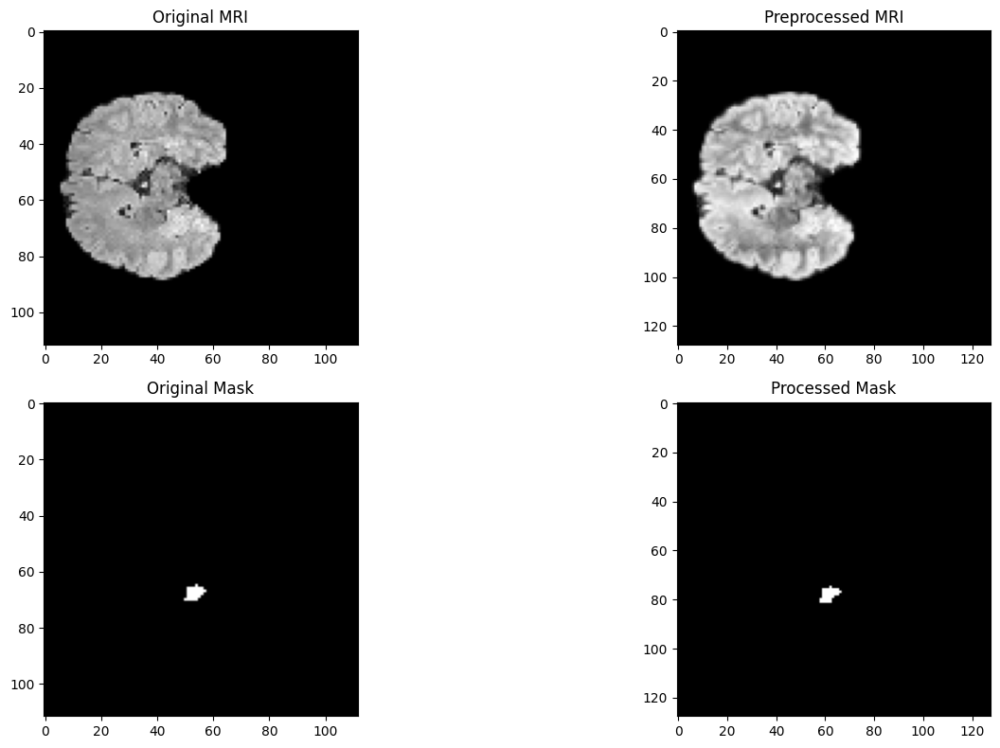

100%|██████████| 327/327 [01:16<00:00,  4.25it/s]



Epoch [1/30] Loss: 1.3914
Validation Dice: 0.3066 | Validation IoU: 0.1939


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [2/30] Loss: 1.2740
Validation Dice: 0.3287 | Validation IoU: 0.2104


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [3/30] Loss: 1.2201
Validation Dice: 0.3497 | Validation IoU: 0.2272


100%|██████████| 327/327 [01:16<00:00,  4.25it/s]



Epoch [4/30] Loss: 1.1764
Validation Dice: 0.2289 | Validation IoU: 0.1423


100%|██████████| 327/327 [01:16<00:00,  4.25it/s]



Epoch [5/30] Loss: 1.1364
Validation Dice: 0.3072 | Validation IoU: 0.1983


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [6/30] Loss: 1.0993
Validation Dice: 0.3294 | Validation IoU: 0.2157


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [7/30] Loss: 1.0642
Validation Dice: 0.3378 | Validation IoU: 0.2205


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [8/30] Loss: 1.0326
Validation Dice: 0.3487 | Validation IoU: 0.2253


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [9/30] Loss: 1.0018
Validation Dice: 0.2714 | Validation IoU: 0.1744


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [10/30] Loss: 0.9699
Validation Dice: 0.2825 | Validation IoU: 0.1779


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [11/30] Loss: 0.9392
Validation Dice: 0.2988 | Validation IoU: 0.1924


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [12/30] Loss: 0.9069
Validation Dice: 0.2970 | Validation IoU: 0.1905


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [13/30] Loss: 0.8778
Validation Dice: 0.3251 | Validation IoU: 0.2087


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [14/30] Loss: 0.8481
Validation Dice: 0.2878 | Validation IoU: 0.1804


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [15/30] Loss: 0.8203
Validation Dice: 0.3246 | Validation IoU: 0.2063


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [16/30] Loss: 0.7869
Validation Dice: 0.2999 | Validation IoU: 0.1904


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [17/30] Loss: 0.7575
Validation Dice: 0.2746 | Validation IoU: 0.1727


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [18/30] Loss: 0.7321
Validation Dice: 0.1524 | Validation IoU: 0.0902


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [19/30] Loss: 0.7004
Validation Dice: 0.3449 | Validation IoU: 0.2211


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [20/30] Loss: 0.6761
Validation Dice: 0.2150 | Validation IoU: 0.1286


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [21/30] Loss: 0.6480
Validation Dice: 0.2866 | Validation IoU: 0.1791


100%|██████████| 327/327 [01:16<00:00,  4.26it/s]



Epoch [22/30] Loss: 0.6242
Validation Dice: 0.2290 | Validation IoU: 0.1395


100%|██████████| 327/327 [01:16<00:00,  4.25it/s]



Epoch [23/30] Loss: 0.5993
Validation Dice: 0.1343 | Validation IoU: 0.0784


100%|██████████| 327/327 [01:16<00:00,  4.25it/s]



Epoch [24/30] Loss: 0.5803
Validation Dice: 0.3020 | Validation IoU: 0.1948


100%|██████████| 327/327 [01:16<00:00,  4.25it/s]



Epoch [25/30] Loss: 0.5584
Validation Dice: 0.2100 | Validation IoU: 0.1304


100%|██████████| 327/327 [01:16<00:00,  4.25it/s]



Epoch [26/30] Loss: 0.5249
Validation Dice: 0.2957 | Validation IoU: 0.1861


100%|██████████| 327/327 [01:16<00:00,  4.25it/s]



Epoch [27/30] Loss: 0.5065
Validation Dice: 0.1809 | Validation IoU: 0.1092


100%|██████████| 327/327 [01:16<00:00,  4.25it/s]



Epoch [28/30] Loss: 0.4814
Validation Dice: 0.2267 | Validation IoU: 0.1366


100%|██████████| 327/327 [01:16<00:00,  4.25it/s]



Epoch [29/30] Loss: 0.4673
Validation Dice: 0.2417 | Validation IoU: 0.1465


100%|██████████| 327/327 [01:16<00:00,  4.25it/s]



Epoch [30/30] Loss: 0.4442
Validation Dice: 0.2087 | Validation IoU: 0.1254
Validation Dice: 0.2087 | Validation IoU: 0.1254

================ TEST RESULTS ================
Dice Score : 0.1274
IoU Score  : 0.0743


ValueError: x and y must have same first dimension, but have shapes (30,) and (31,)

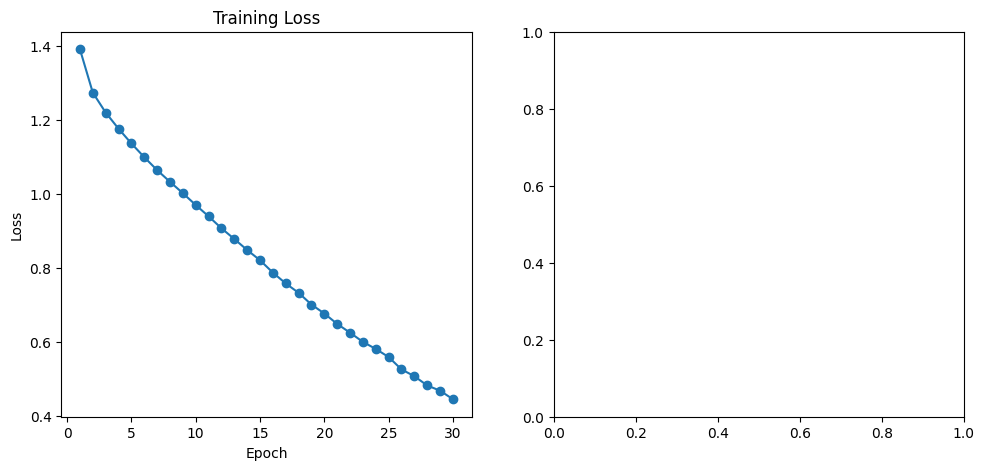

In [6]:
# ============================================================
# ISLES LESION SEGMENTATION USING MGU-NET + TRANSFORMER
!pip install nibabel -q
!pip install segmentation-models-pytorch -q

# ============================================================
# IMPORTS
import os
import glob
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

from tqdm import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from sklearn.model_selection import train_test_split

# ============================================================
# DEVICE
# ============================================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# ============================================================
# BASE DIRECTORY
# ============================================================

base_dir = "/kaggle/input/datasets/tashinayak/isles-dataset-set"

# ============================================================
# GET ALL CASES
# ============================================================

case_dirs = sorted(glob.glob(os.path.join(base_dir, "sub-*")))

print("Total Cases:", len(case_dirs))

# ============================================================
# LOAD DATA PATHS
# ============================================================

image_paths = []
mask_paths = []

import os

base_dir = "isles_dataset_set"

for case in os.listdir(base_dir):
    case_path = os.path.join(base_dir, case)

    # Check if it is a directory
    if os.path.isdir(case_path):

        img = os.path.join(case_path, f"{case}_anat_reg.nii")
        mask = os.path.join(case_path, f"{case}_mask_reg.nii")

        # Verify files exist
        if os.path.exists(img) and os.path.exists(mask):
            print("Image:", img)
            print("Mask :", mask)
# ============================================================
# DATASET
# ============================================================

IMG_SIZE = 256

class ISLESDataset(Dataset):

    def __init__(self, image_paths, mask_paths):

        self.samples = []

        for img_path, mask_path in zip(image_paths, mask_paths):

            img_nii = nib.load(img_path).get_fdata().astype(np.float32)

            mask_nii = nib.load(mask_path).get_fdata().astype(np.float32)

            # ------------------------------------------------
            # SLICE EXTRACTION
            # ------------------------------------------------

            for i in range(img_nii.shape[-1]):

                img_slice = img_nii[:, :, i]

                mask_slice = mask_nii[:, :, i]

                # Skip tiny lesions
                if np.sum(mask_slice) < 120:
                    continue

                self.samples.append((img_slice, mask_slice))

        print("Total training slices:", len(self.samples))

    # ========================================================
    # LENGTH
    # ========================================================

    def __len__(self):

        return len(self.samples)

    # ========================================================
    # GET ITEM
    # ========================================================

    def __getitem__(self, idx):

        image, mask = self.samples[idx]

        # ----------------------------------------------------
        # IMAGE PREPROCESSING
        # ----------------------------------------------------

        image = image.astype(np.float32)

        # Z-score normalization
        image = (
            image - np.mean(image)
        ) / (
            np.std(image) + 1e-8
        )

        # CLAHE enhancement
        image = cv2.normalize(
            image,
            None,
            0,
            255,
            cv2.NORM_MINMAX
        ).astype(np.uint8)

        clahe = cv2.createCLAHE(
            clipLimit=2.0,
            tileGridSize=(8,8)
        )

        image = clahe.apply(image)

        image = image.astype(np.float32) / 255.0

        # ----------------------------------------------------
        # MASK
        # ----------------------------------------------------

        mask = (mask > 0).astype(np.float32)

        # ----------------------------------------------------
        # RESIZE
        # ----------------------------------------------------

        image = cv2.resize(
            image,
            (IMG_SIZE, IMG_SIZE),
            interpolation=cv2.INTER_LINEAR
        )

        mask = cv2.resize(
            mask,
            (IMG_SIZE, IMG_SIZE),
            interpolation=cv2.INTER_NEAREST
        )

        # ----------------------------------------------------
        # CONVERT TO TENSOR
        # ----------------------------------------------------

        image = torch.from_numpy(image).unsqueeze(0).float()

        mask = torch.from_numpy(mask).unsqueeze(0).float()

        return image, mask
        

# ============================================================
# TRAIN VAL SPLIT
# ============================================================

train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    image_paths,
    mask_paths,
    test_size=0.2,
    random_state=42
)

train_dataset = ISLESDataset(train_imgs, train_masks)
val_dataset   = ISLESDataset(val_imgs, val_masks)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=8)

# ============================================================
# MGU BLOCK
# ============================================================

class MGUBlock(nn.Module):

    def __init__(self, in_ch, out_ch):

        super(MGUBlock, self).__init__()

        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        self.bn1   = nn.BatchNorm2d(out_ch)

        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bn2   = nn.BatchNorm2d(out_ch)

        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):

        x = self.relu(self.bn1(self.conv1(x)))
        x = self.relu(self.bn2(self.conv2(x)))

        return x


# ============================================================
# TRANSFORMER BOTTLENECK
# ============================================================

class TransformerBlock(nn.Module):

    def __init__(self, dim, heads=8):

        super().__init__()

        self.norm1 = nn.LayerNorm(dim)

        self.attn = nn.MultiheadAttention(
            embed_dim=dim,
            num_heads=heads,
            batch_first=True
        )
        self.norm2 = nn.LayerNorm(dim)

        self.mlp = nn.Sequential(
            nn.Linear(dim, dim * 4),
            nn.GELU(),
            nn.Linear(dim * 4, dim)
        )

    def forward(self, x):
        h = x
        x = self.norm1(x)
        x, _ = self.attn(x, x, x)
        x = x + h
        h = x
        x = self.norm2(x)
        x = self.mlp(x)
        x = x + h
        return x

# ============================================================
# MGU-NET + TRANSFORMER
# ============================================================

class MGUNetTransformer(nn.Module):

    def __init__(self):

        super().__init__()

        # Encoder
        self.enc1 = MGUBlock(1, 64)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = MGUBlock(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = MGUBlock(128, 256)
        self.pool3 = nn.MaxPool2d(2)

        # Transformer bottleneck
        self.bottleneck = MGUBlock(256, 512)

        self.transformer = TransformerBlock(dim=512)

        # Decoder
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = MGUBlock(512, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = MGUBlock(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = MGUBlock(128, 64)

        self.final = nn.Conv2d(64, 1, 1)

    def forward(self, x):

        # Encoder
        e1 = self.enc1(x)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        e3 = self.enc3(p2)
        p3 = self.pool3(e3)

        # Bottleneck
        b = self.bottleneck(p3)

        B, C, H, W = b.shape

        # Flatten for transformer
        b_flat = b.flatten(2).transpose(1, 2)

        b_trans = self.transformer(b_flat)

        b = b_trans.transpose(1, 2).reshape(B, C, H, W)

        # Decoder
        d3 = self.up3(b)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        out = self.final(d1)

        return out
# ============================================================
# MODEL
# ============================================================
model = MGUNetTransformer().to(device)
# ============================================================
# LOSS + OPTIMIZER
# ============================================================
#criterion = nn.BCEWithLogitsLoss()
class DiceBCELoss(nn.Module):

    def __init__(self):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1e-6):

        bce = nn.functional.binary_cross_entropy_with_logits(
            inputs,
            targets
        )

        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()

        dice = (
            2. * intersection + smooth
        ) / (
            inputs.sum() + targets.sum() + smooth
        )

        dice_loss = 1 - dice

        return bce + dice_loss
criterion = DiceBCELoss()
""""class TverskyLoss(nn.Module):

    def __init__(self, alpha=0.7, beta=0.3, smooth=1e-6):
        super(TverskyLoss, self).__init__()

        self.alpha = alpha
        self.beta = beta
        self.smooth = smooth

    def forward(self, inputs, targets):

        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        TP = (inputs * targets).sum()
        FP = ((1 - targets) * inputs).sum()
        FN = (targets * (1 - inputs)).sum()

        tversky = (
            TP + self.smooth
        ) / (
            TP +
            self.alpha * FP +
            self.beta * FN +
            self.smooth
        )

        return 1 - tversky
criterion = TverskyLoss()"""
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
# ============================================================
# DICE SCORE
# ============================================================
def dice_score(pred, target, smooth=1e-6):

    pred = torch.sigmoid(pred)

    pred = (pred > 0.5).float()

    pred = pred.contiguous().view(-1)
    target = target.contiguous().view(-1)

    intersection = (pred * target).sum()

    dice = (
        2. * intersection + smooth
    ) / (
        pred.sum() + target.sum() + smooth
    )

    return dice.item()

def iou_score(pred, target, smooth=1e-6):

    pred = torch.sigmoid(pred)

    pred = (pred > 0.5).float()

    pred = pred.view(-1)
    target = target.view(-1)

    intersection = (pred * target).sum()

    union = pred.sum() + target.sum() - intersection

    iou = (
        intersection + smooth
    ) / (
        union + smooth
    )

    return iou.item()

# ============================================================
# VISUALIZE BEFORE vs AFTER PREPROCESSING
# ============================================================

import random
import cv2
import matplotlib.pyplot as plt

# Pick random case
idx = random.randint(0, len(image_paths)-1)

img_path = image_paths[idx]
mask_path = mask_paths[idx]

# Load raw .nii volumes
img_nii = nib.load(img_path).get_fdata().astype(np.float32)
mask_nii = nib.load(mask_path).get_fdata().astype(np.float32)

# ------------------------------------------------------------
# Find slice containing lesion
# ------------------------------------------------------------

slice_idx = None

for i in range(mask_nii.shape[-1]):

    if np.sum(mask_nii[:, :, i]) > 20:
        slice_idx = i
        break

print("Selected Slice:", slice_idx)

# ------------------------------------------------------------
# ORIGINAL SLICES
# ------------------------------------------------------------

orig_img = img_nii[:, :, slice_idx]
orig_mask = mask_nii[:, :, slice_idx]

# ------------------------------------------------------------
# PREPROCESSING
# ------------------------------------------------------------

# Z-score normalization
proc_img = (
    orig_img - np.mean(orig_img)
) / (
    np.std(orig_img) + 1e-8
)

# CLAHE enhancement
proc_img = cv2.normalize(
    proc_img,
    None,
    0,
    255,
    cv2.NORM_MINMAX
).astype(np.uint8)

clahe = cv2.createCLAHE(
    clipLimit=2.0,
    tileGridSize=(8,8)
)

proc_img = clahe.apply(proc_img)

proc_img = proc_img.astype(np.float32) / 255.0

# Resize
proc_img = cv2.resize(proc_img, (128,128))

proc_mask = cv2.resize(
    orig_mask,
    (128,128),
    interpolation=cv2.INTER_NEAREST
)

# Binarize mask
proc_mask = (proc_mask > 0).astype(np.float32)
# ============================================================
# TRAIN / VAL / TEST SPLIT
# ============================================================

train_imgs, temp_imgs, train_masks, temp_masks = train_test_split(
    image_paths,
    mask_paths,
    test_size=0.2,
    random_state=42
)

val_imgs, test_imgs, val_masks, test_masks = train_test_split(
    temp_imgs,
    temp_masks,
    test_size=0.5,
    random_state=42
)

print("Train cases:", len(train_imgs))
print("Validation cases:", len(val_imgs))
print("Test cases:", len(test_imgs))
# ============================================================
# CREATE DATASETS
# ============================================================

train_dataset = ISLESDataset(train_imgs, train_masks)

val_dataset = ISLESDataset(val_imgs, val_masks)

test_dataset = ISLESDataset(test_imgs, test_masks)
# ============================================================
# DATALOADERS
# ============================================================

train_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=4
)

test_loader = DataLoader(
    test_dataset,
    batch_size=4
)
# ============================================================
# CREATE DATASETS
# ============================================================

train_dataset = ISLESDataset(train_imgs, train_masks)

val_dataset = ISLESDataset(val_imgs, val_masks)

test_dataset = ISLESDataset(test_imgs, test_masks)
# ------------------------------------------------------------
# DISPLAY
# ------------------------------------------------------------

plt.figure(figsize=(16,8))

# ORIGINAL MRI
plt.subplot(2,2,1)
plt.imshow(orig_img, cmap='gray')
plt.title("Original MRI")

# PREPROCESSED MRI
plt.subplot(2,2,2)
plt.imshow(proc_img, cmap='gray')
plt.title("Preprocessed MRI")

# ORIGINAL MASK
plt.subplot(2,2,3)
plt.imshow(orig_mask, cmap='gray')
plt.title("Original Mask")

# PROCESSED MASK
plt.subplot(2,2,4)
plt.imshow(proc_mask, cmap='gray')
plt.title("Processed Mask")

plt.tight_layout()
plt.show()
# ============================================================
# TRAINING LOOP
# ============================================================

train_losses = []
val_dices = []
val_ious = []

EPOCHS = 30

train_losses = []
for epoch in range(EPOCHS):

    # ================= TRAINING =================

    model.train()

    running_loss = 0

    for images, masks in tqdm(train_loader):

        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = criterion(outputs, masks)

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(train_loader)
    train_losses.append(epoch_loss)

    print(f"\nEpoch [{epoch+1}/{EPOCHS}] Loss: {epoch_loss:.4f}")


    # ================= VALIDATION =================

    model.eval()

    val_dice = 0
    val_iou = 0

    with torch.no_grad():

        for val_images, val_masks in val_loader:

            val_images = val_images.to(device)
            val_masks = val_masks.to(device)

            val_outputs = model(val_images)

            val_dice += dice_score(val_outputs, val_masks)

            val_iou += iou_score(val_outputs, val_masks)
    val_dice /= len(val_loader)
    val_iou /= len(val_loader)

    #  VERY IMPORTANT
    val_dices.append(val_dice)
    val_ious.append(val_iou)

    print(
        f"Validation Dice: {val_dice:.4f} | Validation IoU: {val_iou:.4f}"
    )
# ================= VALIDATION =================

model.eval()

val_dice = 0
val_iou = 0

with torch.no_grad():

    for val_images, val_masks in val_loader:

        val_images = val_images.to(device)
        val_masks = val_masks.to(device)

        val_outputs = model(val_images)

        val_dice += dice_score(val_outputs, val_masks)
        val_iou += iou_score(val_outputs, val_masks)

val_dice /= len(val_loader)
val_iou /= len(val_loader)

val_dices.append(val_dice)
val_ious.append(val_iou)

print(
    f"Validation Dice: {val_dice:.4f} | Validation IoU: {val_iou:.4f}"
)

# ============================================================
# TESTING
# ============================================================

model.eval()

test_dice = 0
test_iou = 0

with torch.no_grad():

    for images, masks in test_loader:

        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)

        test_dice += dice_score(outputs, masks)
        test_iou += iou_score(outputs, masks)

test_dice /= len(test_loader)
test_iou /= len(test_loader)

print("\n================ TEST RESULTS ================")
print(f"Dice Score : {test_dice:.4f}")
print(f"IoU Score  : {test_iou:.4f}")
print("==============================================")

# ============================================================
# TRAINING CURVES
# ============================================================

epochs_range = range(1, len(train_losses)+1)

plt.figure(figsize=(18,5))

# ------------------------------------------------------------
# LOSS
# ------------------------------------------------------------

plt.subplot(1,3,1)

plt.plot(
    epochs_range,
    train_losses,
    marker='o'
)

plt.title("Training Loss")

plt.xlabel("Epoch")

plt.ylabel("Loss")

# ------------------------------------------------------------
# DICE
# ------------------------------------------------------------

plt.subplot(1,3,2)

plt.plot(
    epochs_range,
    val_dices,
    marker='o'
)

plt.title("Validation Dice")

plt.xlabel("Epoch")

plt.ylabel("Dice Score")

# ------------------------------------------------------------
# IOU
# ------------------------------------------------------------

plt.subplot(1,3,3)

plt.plot(
    epochs_range,
    val_ious,
    marker='o'
)

plt.title("Validation IoU")

plt.xlabel("Epoch")

plt.ylabel("IoU")

plt.tight_layout()

plt.show()

# ============================================================
# SAVE MODEL
# ============================================================

torch.save(model.state_dict(), "mgu_transformer_isles.pth")

print("Model Saved!")

# ============================================================
# VISUALIZATION
# ============================================================

model.eval()

with torch.no_grad():

    sample_img, sample_mask = val_dataset[0]

    input_tensor = sample_img.unsqueeze(0).to(device)

    pred = model(input_tensor)

    pred = torch.sigmoid(pred).cpu().numpy()[0,0]

    pred = (pred > 0.5).astype(np.float32)

# ============================================================
# DISPLAY RESULTS
# ============================================================

plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(sample_img.squeeze(), cmap='gray')
plt.title("MRI")

plt.subplot(1,3,2)
plt.imshow(sample_mask.squeeze(), cmap='gray')
plt.title("Ground Truth")

plt.subplot(1,3,3)
plt.imshow(pred, cmap='gray')
plt.title("Predicted Lesion")

plt.show()

# ============================================================
# VISUALIZE TEST PREDICTIONS
# ============================================================

model.eval()

num_samples = 3

with torch.no_grad():

    for i in range(num_samples):

        img, mask = val_dataset[i]

        input_tensor = img.unsqueeze(0).to(device)

        pred = model(input_tensor)

        pred = torch.sigmoid(pred)

        pred = (pred > 0.5).float()

        pred = pred.cpu().numpy()[0,0]

        plt.figure(figsize=(12,4))

        plt.subplot(1,3,1)
        plt.imshow(img.squeeze(), cmap='gray')
        plt.title("MRI")

        plt.subplot(1,3,2)
        plt.imshow(mask.squeeze(), cmap='gray')
        plt.title("Ground Truth")

        plt.subplot(1,3,3)
        plt.imshow(pred, cmap='gray')
        plt.title("Prediction")

        plt.show()

# ============================================================
# OVERLAY PREDICTIONS ON MRI
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

model.eval()

num_samples = 3

with torch.no_grad():

    for i in range(num_samples):

        # ----------------------------------------------------
        # GET SAMPLE
        # ----------------------------------------------------

        image, mask = test_dataset[i]

        input_tensor = image.unsqueeze(0).to(device)

        # ----------------------------------------------------
        # PREDICTION
        # ----------------------------------------------------

        pred = model(input_tensor)

        pred = torch.sigmoid(pred)

        pred = (pred > 0.5).float()

        pred = pred.cpu().numpy()[0, 0]

        # ----------------------------------------------------
        # CONVERT TO NUMPY
        # ----------------------------------------------------

        image_np = image.squeeze().cpu().numpy()

        mask_np = mask.squeeze().cpu().numpy()

        # ----------------------------------------------------
        # CREATE OVERLAYS
        # ----------------------------------------------------

        gt_overlay = np.zeros((128,128,3))
        pred_overlay = np.zeros((128,128,3))

        # RED = Ground Truth
        gt_overlay[...,0] = mask_np

        # GREEN = Prediction
        pred_overlay[...,1] = pred

        # ----------------------------------------------------
        # DISPLAY
        # ----------------------------------------------------

        plt.figure(figsize=(18,6))

        # ORIGINAL MRI
        plt.subplot(1,3,1)
        plt.imshow(image_np, cmap='gray')
        plt.title("Original MRI")
        plt.axis("off")

        # MRI + GROUND TRUTH
        plt.subplot(1,3,2)

        plt.imshow(image_np, cmap='gray')

        plt.imshow(
            gt_overlay,
            alpha=0.5
        )

        plt.title("Ground Truth Overlay")
        plt.axis("off")

        # MRI + PREDICTION
        plt.subplot(1,3,3)

        plt.imshow(image_np, cmap='gray')

        plt.imshow(
            pred_overlay,
            alpha=0.5
        )

        plt.title("Prediction Overlay")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

In [ ]:
    """"def dice_score(pred, target, smooth=1e-6):

    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()

    intersection = (pred * target).sum()

    return (
        (2. * intersection + smooth)
        /
        (pred.sum() + target.sum() + smooth)
    )"""
"""" self.transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize((IMG_SIZE, IMG_SIZE))
        ])"""

Dice Score: 0.0


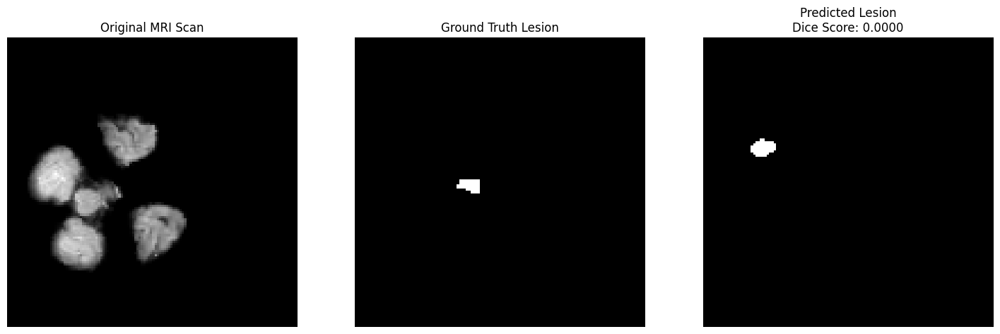

In [14]:
train_dataset = ISLESDataset(train_imgs, train_masks)
        
image, mask = train_dataset[0]

print(image.shape)
print(mask.shape)
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(image.squeeze(), cmap='gray')
plt.title("MRI")

plt.subplot(1,2,2)
plt.imshow(mask.squeeze(), cmap='gray')
plt.title("Mask")

plt.show()
# ============================================================
# VISUALIZE MRI + PREDICTION + DICE SCORE
# ============================================================

model.eval()

with torch.no_grad():

    # Get one validation sample
    sample_img, sample_mask = val_dataset[0]

    # Add batch dimension
    input_tensor = sample_img.unsqueeze(0).float().to(device)

    # Prediction
    pred = model(input_tensor)

    # Dice Score
    dice = dice_score(pred, sample_mask.unsqueeze(0).to(device))

    print("Dice Score:", round(dice.item(), 4))

    # Convert prediction to binary mask
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()

    # Convert to numpy
    pred_np = pred.cpu().numpy()[0, 0]

    original_img = sample_img.squeeze().cpu().numpy()
    true_mask = sample_mask.squeeze().cpu().numpy()

# ============================================================
# DISPLAY RESULTS
# ============================================================

plt.figure(figsize=(18,6))

# Original MRI
plt.subplot(1,3,1)
plt.imshow(original_img, cmap='gray')
plt.title("Original MRI Scan")
plt.axis("off")

# Ground Truth
plt.subplot(1,3,2)
plt.imshow(true_mask, cmap='gray')
plt.title("Ground Truth Lesion")
plt.axis("off")

# Prediction
plt.subplot(1,3,3)
plt.imshow(pred_np, cmap='gray')
plt.title(f"Predicted Lesion\nDice Score: {dice.item():.4f}")
plt.axis("off")

plt.show()

Device: cuda
Total Cases: 250
Images: 250
Masks : 250
Train: 200
Val: 25
Test: 25
Total slices: 653
Total slices: 97
Total slices: 36


100%|██████████| 164/164 [00:12<00:00, 12.81it/s]



Epoch [1/50] Loss: 0.6394 | Dice: 0.3750 | IoU: 0.2357
Best model saved!


100%|██████████| 164/164 [00:13<00:00, 12.52it/s]



Epoch [2/50] Loss: 0.5221 | Dice: 0.4549 | IoU: 0.3013
Best model saved!


100%|██████████| 164/164 [00:12<00:00, 12.79it/s]



Epoch [3/50] Loss: 0.4620 | Dice: 0.6072 | IoU: 0.4461
Best model saved!


100%|██████████| 164/164 [00:12<00:00, 13.07it/s]



Epoch [4/50] Loss: 0.4196 | Dice: 0.5749 | IoU: 0.4170


100%|██████████| 164/164 [00:12<00:00, 13.21it/s]



Epoch [5/50] Loss: 0.3777 | Dice: 0.4754 | IoU: 0.3201


100%|██████████| 164/164 [00:12<00:00, 13.21it/s]



Epoch [6/50] Loss: 0.3447 | Dice: 0.6061 | IoU: 0.4475


100%|██████████| 164/164 [00:12<00:00, 13.15it/s]



Epoch [7/50] Loss: 0.3181 | Dice: 0.3170 | IoU: 0.1917


100%|██████████| 164/164 [00:12<00:00, 13.00it/s]



Epoch [8/50] Loss: 0.2901 | Dice: 0.5449 | IoU: 0.3818


100%|██████████| 164/164 [00:12<00:00, 12.90it/s]



Epoch [9/50] Loss: 0.2648 | Dice: 0.3844 | IoU: 0.2604


100%|██████████| 164/164 [00:12<00:00, 12.92it/s]



Epoch [10/50] Loss: 0.2414 | Dice: 0.4344 | IoU: 0.2831


100%|██████████| 164/164 [00:12<00:00, 12.96it/s]



Epoch [11/50] Loss: 0.2241 | Dice: 0.5012 | IoU: 0.3422


100%|██████████| 164/164 [00:12<00:00, 13.08it/s]



Epoch [12/50] Loss: 0.2026 | Dice: 0.5119 | IoU: 0.3523


100%|██████████| 164/164 [00:12<00:00, 13.11it/s]



Epoch [13/50] Loss: 0.2008 | Dice: 0.5240 | IoU: 0.3646


100%|██████████| 164/164 [00:12<00:00, 13.09it/s]



Epoch [14/50] Loss: 0.1824 | Dice: 0.6094 | IoU: 0.4510
Best model saved!


100%|██████████| 164/164 [00:12<00:00, 13.09it/s]



Epoch [15/50] Loss: 0.1670 | Dice: 0.6312 | IoU: 0.4748
Best model saved!


100%|██████████| 164/164 [00:12<00:00, 13.12it/s]



Epoch [16/50] Loss: 0.1499 | Dice: 0.5690 | IoU: 0.4083


100%|██████████| 164/164 [00:12<00:00, 13.08it/s]



Epoch [17/50] Loss: 0.1434 | Dice: 0.6263 | IoU: 0.4668


100%|██████████| 164/164 [00:12<00:00, 13.11it/s]



Epoch [18/50] Loss: 0.1332 | Dice: 0.6233 | IoU: 0.4645


100%|██████████| 164/164 [00:12<00:00, 13.12it/s]



Epoch [19/50] Loss: 0.1289 | Dice: 0.6438 | IoU: 0.4892
Best model saved!


100%|██████████| 164/164 [00:12<00:00, 13.15it/s]



Epoch [20/50] Loss: 0.1251 | Dice: 0.5996 | IoU: 0.4418


100%|██████████| 164/164 [00:12<00:00, 13.14it/s]



Epoch [21/50] Loss: 0.1128 | Dice: 0.6140 | IoU: 0.4570


100%|██████████| 164/164 [00:12<00:00, 13.11it/s]



Epoch [22/50] Loss: 0.1065 | Dice: 0.5685 | IoU: 0.4089


100%|██████████| 164/164 [00:12<00:00, 13.10it/s]



Epoch [23/50] Loss: 0.1014 | Dice: 0.6088 | IoU: 0.4484


100%|██████████| 164/164 [00:12<00:00, 13.14it/s]



Epoch [24/50] Loss: 0.0990 | Dice: 0.6340 | IoU: 0.4758


100%|██████████| 164/164 [00:12<00:00, 13.16it/s]



Epoch [25/50] Loss: 0.0967 | Dice: 0.6214 | IoU: 0.4624


100%|██████████| 164/164 [00:12<00:00, 13.15it/s]



Epoch [26/50] Loss: 0.1269 | Dice: 0.6242 | IoU: 0.4678


100%|██████████| 164/164 [00:12<00:00, 13.14it/s]



Epoch [27/50] Loss: 0.0866 | Dice: 0.6420 | IoU: 0.4870


100%|██████████| 164/164 [00:12<00:00, 13.16it/s]



Epoch [28/50] Loss: 0.0801 | Dice: 0.6146 | IoU: 0.4579


100%|██████████| 164/164 [00:12<00:00, 13.15it/s]



Epoch [29/50] Loss: 0.0767 | Dice: 0.6388 | IoU: 0.4833


100%|██████████| 164/164 [00:12<00:00, 13.13it/s]



Epoch [30/50] Loss: 0.0719 | Dice: 0.6415 | IoU: 0.4869


100%|██████████| 164/164 [00:12<00:00, 13.13it/s]



Epoch [31/50] Loss: 0.0708 | Dice: 0.6366 | IoU: 0.4821


100%|██████████| 164/164 [00:12<00:00, 13.11it/s]



Epoch [32/50] Loss: 0.0680 | Dice: 0.6334 | IoU: 0.4776


100%|██████████| 164/164 [00:12<00:00, 13.09it/s]



Epoch [33/50] Loss: 0.0649 | Dice: 0.6422 | IoU: 0.4890


100%|██████████| 164/164 [00:12<00:00, 13.07it/s]



Epoch [34/50] Loss: 0.0633 | Dice: 0.6148 | IoU: 0.4593


100%|██████████| 164/164 [00:12<00:00, 13.07it/s]



Epoch [35/50] Loss: 0.0651 | Dice: 0.6278 | IoU: 0.4730


100%|██████████| 164/164 [00:12<00:00, 13.05it/s]



Epoch [36/50] Loss: 0.0641 | Dice: 0.6086 | IoU: 0.4537


100%|██████████| 164/164 [00:12<00:00, 13.14it/s]



Epoch [37/50] Loss: 0.0604 | Dice: 0.6436 | IoU: 0.4903


100%|██████████| 164/164 [00:12<00:00, 13.16it/s]



Epoch [38/50] Loss: 0.0565 | Dice: 0.6294 | IoU: 0.4738


100%|██████████| 164/164 [00:12<00:00, 13.14it/s]



Epoch [39/50] Loss: 0.0566 | Dice: 0.6342 | IoU: 0.4800


100%|██████████| 164/164 [00:12<00:00, 13.15it/s]



Epoch [40/50] Loss: 0.0572 | Dice: 0.6446 | IoU: 0.4907
Best model saved!


100%|██████████| 164/164 [00:12<00:00, 13.11it/s]



Epoch [41/50] Loss: 0.0757 | Dice: 0.6123 | IoU: 0.4531


100%|██████████| 164/164 [00:12<00:00, 13.11it/s]



Epoch [42/50] Loss: 0.0655 | Dice: 0.6408 | IoU: 0.4857


100%|██████████| 164/164 [00:12<00:00, 13.05it/s]



Epoch [43/50] Loss: 0.0538 | Dice: 0.6447 | IoU: 0.4884
Best model saved!


100%|██████████| 164/164 [00:12<00:00, 13.06it/s]



Epoch [44/50] Loss: 0.0494 | Dice: 0.6461 | IoU: 0.4924
Best model saved!


100%|██████████| 164/164 [00:12<00:00, 13.06it/s]



Epoch [45/50] Loss: 0.0486 | Dice: 0.6288 | IoU: 0.4724


100%|██████████| 164/164 [00:12<00:00, 13.11it/s]



Epoch [46/50] Loss: 0.0475 | Dice: 0.6417 | IoU: 0.4884


100%|██████████| 164/164 [00:12<00:00, 13.11it/s]



Epoch [47/50] Loss: 0.0446 | Dice: 0.6460 | IoU: 0.4913


100%|██████████| 164/164 [00:12<00:00, 13.12it/s]



Epoch [48/50] Loss: 0.0525 | Dice: 0.6297 | IoU: 0.4738


100%|██████████| 164/164 [00:12<00:00, 13.13it/s]



Epoch [49/50] Loss: 0.0461 | Dice: 0.6340 | IoU: 0.4780


100%|██████████| 164/164 [00:12<00:00, 13.10it/s]



Epoch [50/50] Loss: 0.0469 | Dice: 0.6378 | IoU: 0.4814

================ TEST RESULTS ================
Dice Score : 0.7874
IoU Score  : 0.6542


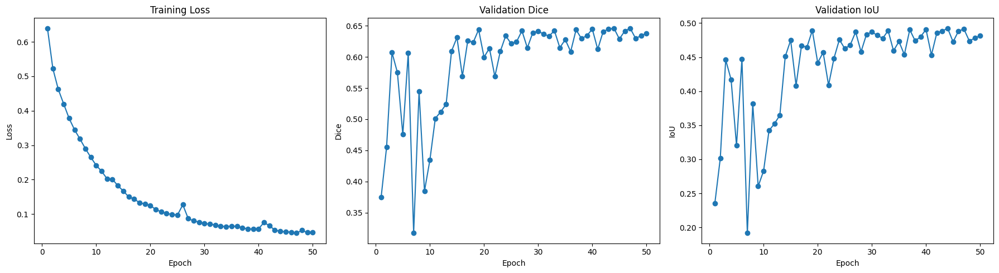

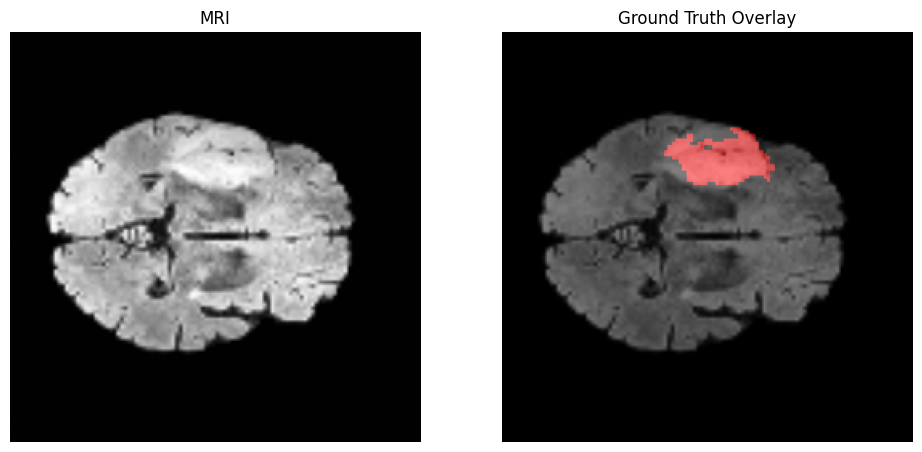

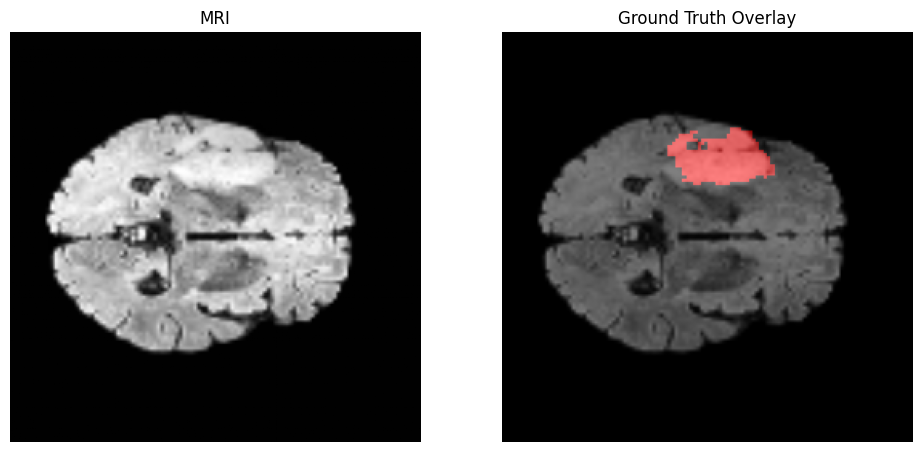

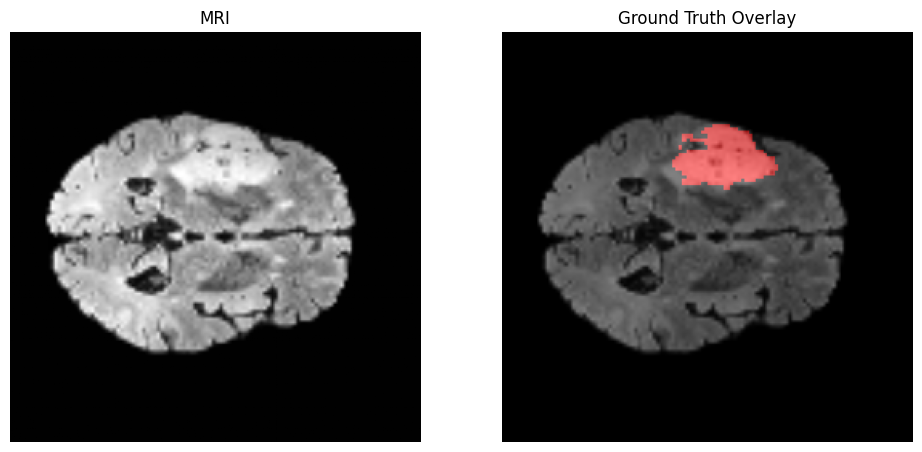

In [10]:
# ============================================================
# ISLES STROKE LESION SEGMENTATION USING MGU-NET
# BCE + DICE LOSS
# ============================================================
!pip install nibabel -q
# ============================================================
# IMPORTS
# ============================================================

import os
import glob
import cv2
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split

# ============================================================
# DEVICE
# ============================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)
# ============================================================
# PATH
# ============================================================
base_dir = "/kaggle/input/datasets/tashinayak/isles-dataset-set"
# ============================================================
# LOAD CASES
# ============================================================
case_dirs = sorted(
    glob.glob(
        os.path.join(base_dir, "sub-*")
    )
)
print("Total Cases:", len(case_dirs))
# ============================================================
# LOAD IMAGE + MASK PATHS
# ============================================================

image_paths = []
mask_paths = []

for case in case_dirs:

    # Example:
    # case = ".../sub-strokecase0001"

    case_name = os.path.basename(case)

    image_file = os.path.join(
        case,
        f"{case_name}_anat_reg.nii"
    )

    mask_file = os.path.join(
        case,
        f"{case_name}_mask_reg.nii"
    )

    if os.path.exists(image_file) and os.path.exists(mask_file):
        image_paths.append(image_file)
        mask_paths.append(mask_file)

print("Images:", len(image_paths))
print("Masks :", len(mask_paths))

# ============================================================
# TRAIN / VAL / TEST SPLIT
# ============================================================

train_imgs, temp_imgs, train_masks, temp_masks = train_test_split(
    image_paths,
    mask_paths,
    test_size=0.2,
    random_state=42
)

val_imgs, test_imgs, val_masks, test_masks = train_test_split(
    temp_imgs,
    temp_masks,
    test_size=0.5,
    random_state=42
)

print("Train:", len(train_imgs))
print("Val:", len(val_imgs))
print("Test:", len(test_imgs))

# ============================================================
# DATASET
# ============================================================

IMG_SIZE = 256
class ISLESDataset(Dataset):
    def __init__(self, image_paths, mask_paths):
        self.samples = []
        for img_path, mask_path in zip(image_paths, mask_paths):
            img_nii = nib.load(img_path).get_fdata().astype(np.float32)
            mask_nii = nib.load(mask_path).get_fdata().astype(np.float32)
            for i in range(img_nii.shape[-1]):
                img_slice = img_nii[:, :, i]
                mask_slice = mask_nii[:, :, i]
                # Skip tiny lesions
                if np.sum(mask_slice) < 300:
                    continue
                self.samples.append(
                    (img_slice, mask_slice)
                )
        print("Total slices:", len(self.samples))
    def __len__(self):
        return len(self.samples)
    def __getitem__(self, idx):
        image, mask = self.samples[idx]
        # ====================================================
        # PREPROCESSING
        # ====================================================

        image = image.astype(np.float32)
       # Normalize
        image = (
            image - image.min()
        ) / (
            image.max() - image.min() + 1e-8
        )
       # CLAHE
        image = cv2.normalize(
            image,
            None,
            0,
            255,
            cv2.NORM_MINMAX
        ).astype(np.uint8)
        
        clahe = cv2.createCLAHE(
            clipLimit=1.5,
            tileGridSize=(8,8)
        )
        image = clahe.apply(image)
        image = image.astype(np.float32) / 255.0
        # Binary mask
        mask = (mask > 0).astype(np.float32)
        # Resize
        image = cv2.resize(
            image,
            (IMG_SIZE, IMG_SIZE),
            interpolation=cv2.INTER_LINEAR
        )
        mask = cv2.resize(
            mask,
            (IMG_SIZE, IMG_SIZE),
            interpolation=cv2.INTER_NEAREST
        )
        # Tensor conversion
        image = torch.from_numpy(image).unsqueeze(0).float()

        mask = torch.from_numpy(mask).unsqueeze(0).float()

        return image, mask

# ============================================================
# DATASETS
# ============================================================

train_dataset = ISLESDataset(train_imgs, train_masks)

val_dataset = ISLESDataset(val_imgs, val_masks)

test_dataset = ISLESDataset(test_imgs, test_masks)

# ============================================================
# DATALOADERS
# ============================================================

train_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=4
)

test_loader = DataLoader(
    test_dataset,
    batch_size=4
)

# ============================================================
# MGU BLOCK
# ============================================================

class MGUBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(MGUBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch,out_ch,kernel_size=3,padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch,out_ch,kernel_size=3,padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.conv(x)
# ============================================================
# MGU-NET
# ============================================================
class MGUNet(nn.Module):
    def __init__(self):
        super(MGUNet, self).__init__()
        # Encoder
        self.enc1 = MGUBlock(1, 32)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = MGUBlock(32, 64)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = MGUBlock(64, 128)
        self.pool3 = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = MGUBlock(128, 256)

        # Decoder
        self.up3 = nn.ConvTranspose2d(
            256,
            128,
            kernel_size=2,
            stride=2
        )

        self.dec3 = MGUBlock(256, 128)

        self.up2 = nn.ConvTranspose2d(
            128,
            64,
            kernel_size=2,
            stride=2
        )

        self.dec2 = MGUBlock(128, 64)
        self.up1 = nn.ConvTranspose2d(
            64,
            32,
            kernel_size=2,
            stride=2
        )

        self.dec1 = MGUBlock(64, 32)

        self.final = nn.Conv2d(32, 1, kernel_size=1)

    def forward(self, x):

        # Encoder
        e1 = self.enc1(x)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        e3 = self.enc3(p2)
        p3 = self.pool3(e3)

        # Bottleneck
        b = self.bottleneck(p3)

        # Decoder
        d3 = self.up3(b)

        d3 = torch.cat([d3, e3], dim=1)

        d3 = self.dec3(d3)

        d2 = self.up2(d3)

        d2 = torch.cat([d2, e2], dim=1)

        d2 = self.dec2(d2)

        d1 = self.up1(d2)

        d1 = torch.cat([d1, e1], dim=1)

        d1 = self.dec1(d1)

        out = self.final(d1)

        return out

# ============================================================
# MODEL
# ============================================================

model = MGUNet().to(device)

# ============================================================
# BCE + DICE LOSS
# ============================================================

""""class DiceBCELoss(nn.Module):

    def __init__(self):
        super(DiceBCELoss, self).__init__()
    def forward(self, inputs, targets, smooth=1e-6):
        bce = nn.functional.binary_cross_entropy_with_logits(
            inputs,
            targets
        )
        inputs = torch.sigmoid(inputs)
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        dice_loss = 1 - dice

        return bce + dice_loss

criterion = DiceBCELoss()"""
class DiceBCELoss(nn.Module):

    def __init__(self):
        super(DiceBCELoss, self).__init__()

        # foreground weighting
        self.bce = nn.BCEWithLogitsLoss(
            pos_weight=torch.tensor([10.0]).to(device)
        )

    def forward(self, inputs, targets, smooth=1):

        # BCE
        bce = self.bce(inputs, targets)

        # Sigmoid
        inputs = torch.sigmoid(inputs)

        # Flatten
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        # Dice
        intersection = (inputs * targets).sum()

        dice = ( 2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        dice_loss = 1 - dice

        return 0.8 * bce + 0.2 * dice_loss

criterion = DiceBCELoss()      

# ============================================================
# OPTIMIZER
# ============================================================

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=1e-4
)

# ============================================================
# METRICS
# ============================================================

def dice_score(pred, target, smooth=1e-6):

    pred = torch.sigmoid(pred)

    pred = (pred > 0.5).float()
    
    intersection = (pred * target).sum()

    dice = (
        2.
        *
        intersection + smooth
    ) / (
        pred.sum() + target.sum() + smooth
    )

    return dice.item()

def iou_score(pred, target, smooth=1e-6):

    pred = torch.sigmoid(pred)

    pred = (pred > 0.5).float()

    pred = pred.view(-1)
    target = target.view(-1)

    intersection = (pred * target).sum()

    union = pred.sum() + target.sum() - intersection

    iou = (
        intersection + smooth
    ) / (
        union + smooth
    )

    return iou.item()

# ============================================================
# TRAINING
# ============================================================

EPOCHS = 50

train_losses = []
val_dices = []
val_ious = []
best_dice = 0
for epoch in range(EPOCHS):
    # ========================================================
    # TRAIN
    # ========================================================

    model.train()
    running_loss = 0
    for images, masks in tqdm(train_loader):
        images = images.to(device)
        masks = masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    epoch_loss = running_loss / len(train_loader)
    train_losses.append(epoch_loss)
    # ========================================================
    # VALIDATION
    # ========================================================
    model.eval()
    val_dice = 0
    val_iou = 0
    with torch.no_grad():
        for val_images, val_masks in val_loader:
            val_images = val_images.to(device)
            val_masks = val_masks.to(device)
            val_outputs = model(val_images)
            val_dice += dice_score(
                val_outputs,
                val_masks
            )
            val_iou += iou_score(
                val_outputs,
                val_masks
            )
    val_dice /= len(val_loader)
    val_iou /= len(val_loader)
    val_dices.append(val_dice)
    val_ious.append(val_iou)
    print(
        f"\nEpoch [{epoch+1}/{EPOCHS}] "
        f"Loss: {epoch_loss:.4f} "
        f"| Dice: {val_dice:.4f} "
        f"| IoU: {val_iou:.4f}"
    )

    # Save best model
    if val_dice >= best_dice:

        best_dice = val_dice

        torch.save(
            model.state_dict(),
            "best_mgunet.pth"
        )

        print("Best model saved!")

# ============================================================
# LOAD BEST MODEL
# ============================================================

model.load_state_dict(
    torch.load("best_mgunet.pth")
)

# ============================================================
# TESTING
# ============================================================

model.eval()

test_dice = 0
test_iou = 0

with torch.no_grad():

    for images, masks in test_loader:

        images = images.to(device)

        masks = masks.to(device)

        outputs = model(images)

        test_dice += dice_score(
            outputs,
            masks
        )

        test_iou += iou_score(
            outputs,
            masks
        )

test_dice /= len(test_loader)

test_iou /= len(test_loader)

print("\n================ TEST RESULTS ================")

print(f"Dice Score : {test_dice:.4f}")

print(f"IoU Score  : {test_iou:.4f}")

print("==============================================")

# ============================================================
# TRAINING GRAPHS
# ============================================================

epochs_range = range(1, len(train_losses)+1)

plt.figure(figsize=(18,5))

# LOSS
plt.subplot(1,3,1)

plt.plot(
    epochs_range,
    train_losses,
    marker='o'
)

plt.title("Training Loss")

plt.xlabel("Epoch")

plt.ylabel("Loss")

# DICE
plt.subplot(1,3,2)

plt.plot(
    epochs_range,
    val_dices,
    marker='o'
)

plt.title("Validation Dice")

plt.xlabel("Epoch")

plt.ylabel("Dice")

# IOU
plt.subplot(1,3,3)

plt.plot(
    epochs_range,
    val_ious,
    marker='o'
)

plt.title("Validation IoU")

plt.xlabel("Epoch")

plt.ylabel("IoU")

plt.tight_layout()

plt.show()


# ============================================================
# VISUALIZE PREDICTIONS
# ============================================================

model.eval()

num_samples = 3

with torch.no_grad():

    for i in range(num_samples):

        image, mask = test_dataset[i]

        input_tensor = image.unsqueeze(0).to(device)

        pred = model(input_tensor)

        pred = torch.sigmoid(pred)

        pred = (pred > 0.1).float()

        pred = pred.cpu().numpy()[0,0]

        image_np = image.squeeze().cpu().numpy()

        mask_np = mask.squeeze().cpu().numpy()

        # ====================================================
        # OVERLAYS
        # ====================================================

        gt_overlay = np.zeros((IMG_SIZE, IMG_SIZE, 3))

        pred_overlay = np.zeros((IMG_SIZE, IMG_SIZE, 3))

        # RED = Ground Truth
        gt_overlay[...,0] = mask_np

        # GREEN = Prediction
        pred_overlay[...,1] = pred

        plt.figure(figsize=(18,6))

        # MRI
        plt.subplot(1,3,1)

        plt.imshow(
            image_np,
            cmap='gray'
        )

        plt.title("MRI")

        plt.axis("off")

        # Ground Truth Overlay
        plt.subplot(1,3,2)

        plt.imshow(
            image_np,
            cmap='gray'
        )

        plt.imshow(
            gt_overlay,
            alpha=0.5
        )

        plt.title("Ground Truth Overlay")

        plt.axis("off")
        

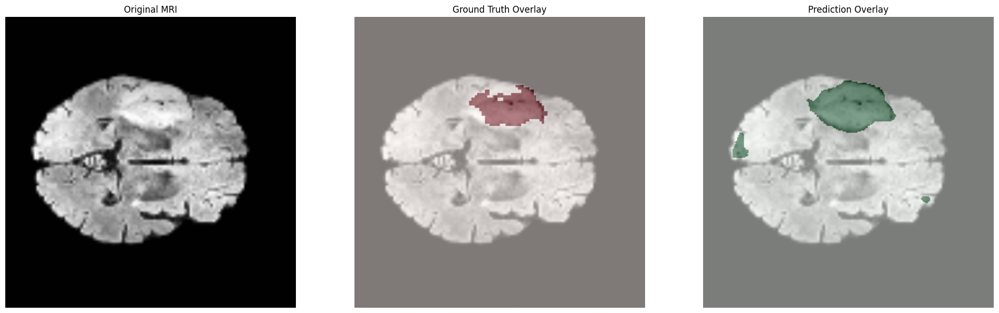

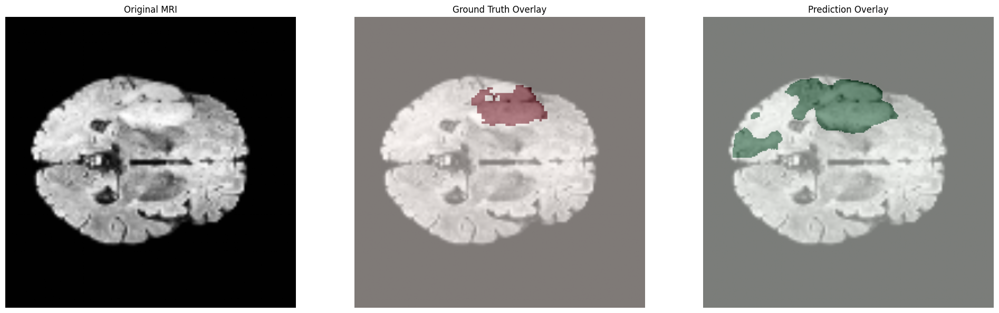

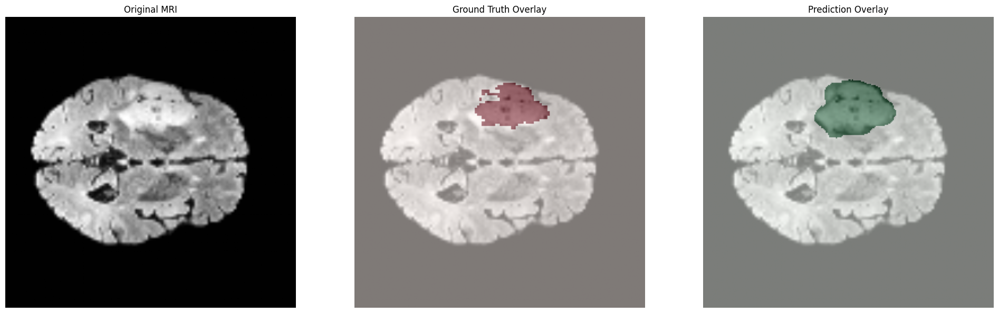

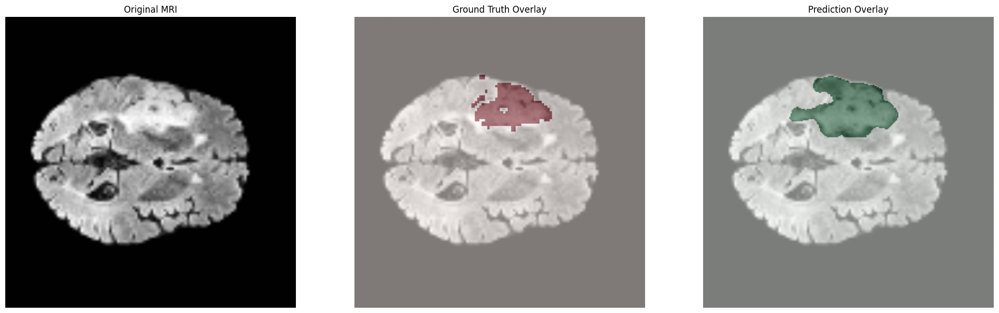

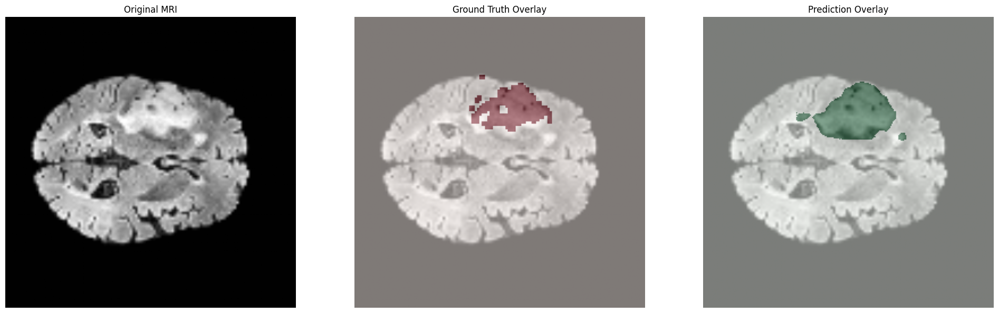

In [2]:
# ============================================================
# CLEAN OVERLAY VISUALIZATION
# ============================================================

model.eval()

num_samples = 5

with torch.no_grad():

    for i in range(num_samples):

        image, mask = test_dataset[i]

        input_tensor = image.unsqueeze(0).to(device)

        pred = model(input_tensor)

        pred = torch.sigmoid(pred)

        pred = (pred > 0.3).float()

        pred = pred.cpu().numpy()[0,0]

        image_np = image.squeeze().cpu().numpy()

        mask_np = mask.squeeze().cpu().numpy()

        # ====================================================
        # DISPLAY
        # ====================================================

        fig, ax = plt.subplots(1,3, figsize=(20,6))

        # ----------------------------------------------------
        # ORIGINAL MRI
        # ----------------------------------------------------

        ax[0].imshow(
            image_np,
            cmap='gray'
        )

        ax[0].set_title("Original MRI")

        ax[0].axis("off")

        # ----------------------------------------------------
        # GROUND TRUTH OVERLAY
        # ----------------------------------------------------

        ax[1].imshow(
            image_np,
            cmap='gray'
        )

        ax[1].imshow(
            mask_np,
            cmap='Reds',
            alpha=0.5
        )

        ax[1].set_title("Ground Truth Overlay")

        ax[1].axis("off")

        # ----------------------------------------------------
        # PREDICTION OVERLAY
        # ----------------------------------------------------

        ax[2].imshow(
            image_np,
            cmap='gray'
        )

        ax[2].imshow(
            pred,
            cmap='Greens',
            alpha=0.5
        )

        ax[2].set_title("Prediction Overlay")

        ax[2].axis("off")

        plt.tight_layout()

        plt.show()

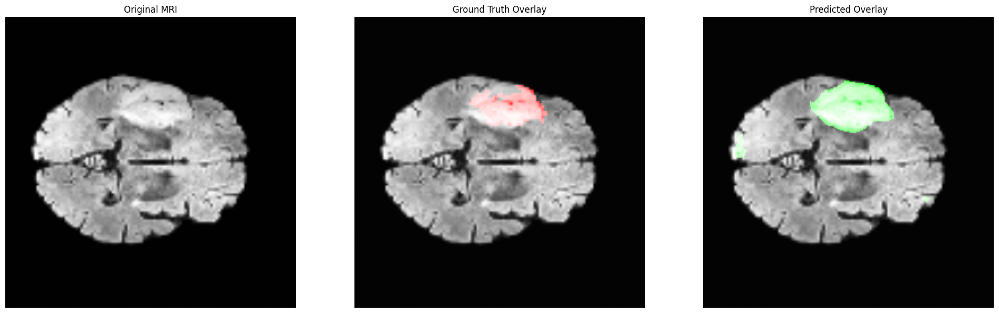

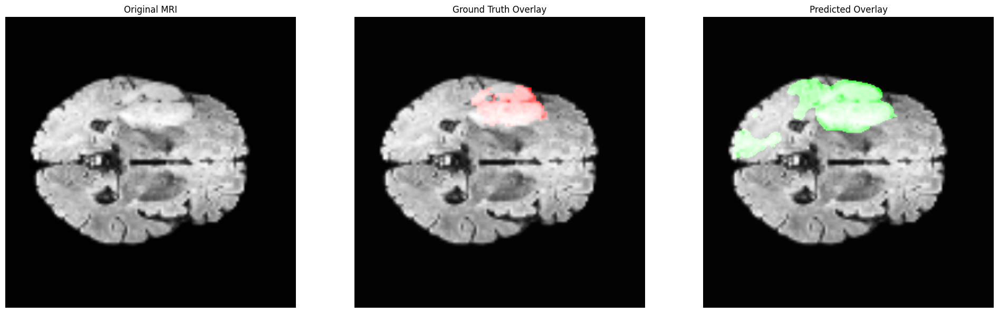

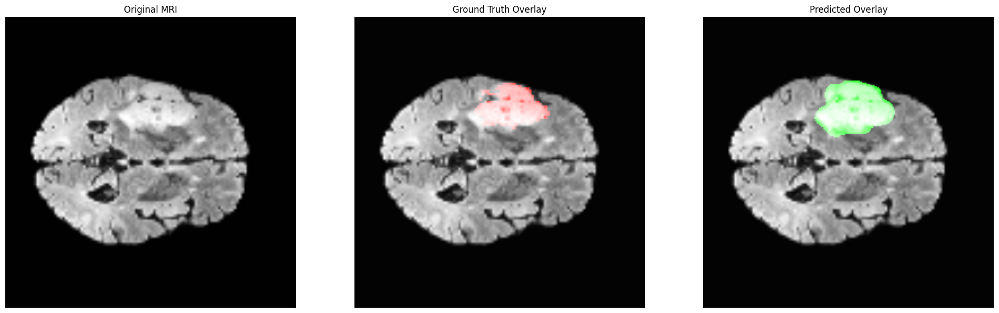

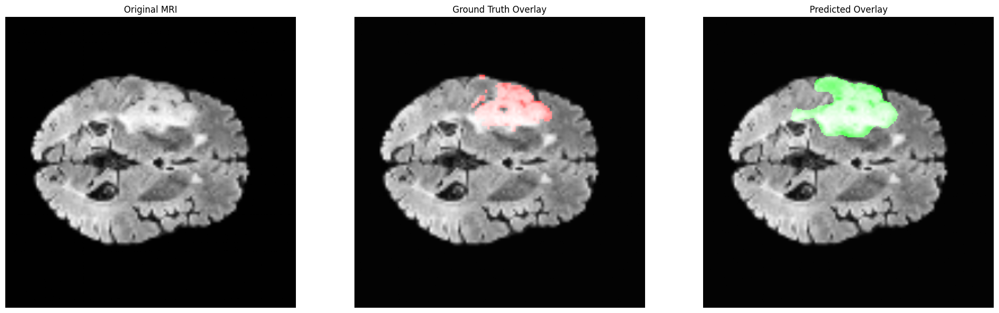

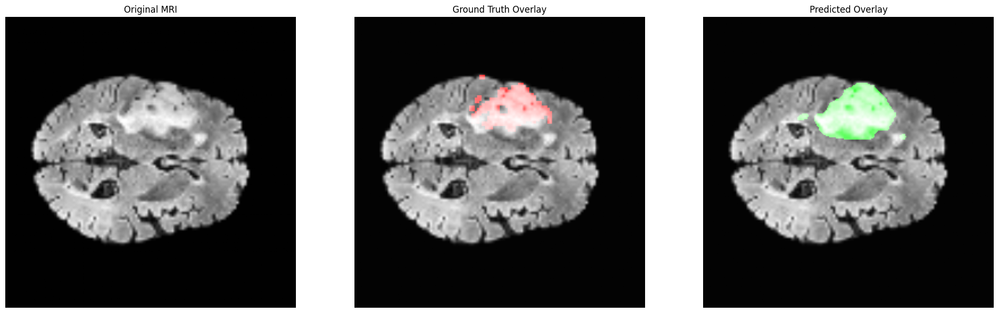

In [3]:
# ============================================================
# FINAL VISUALIZATION
# ============================================================

model.eval()

num_samples = 5

with torch.no_grad():

    for i in range(num_samples):

        # ----------------------------------------------------
        # SAMPLE
        # ----------------------------------------------------

        image, mask = test_dataset[i]

        input_tensor = image.unsqueeze(0).to(device)

        # ----------------------------------------------------
        # PREDICTION
        # ----------------------------------------------------

        pred = model(input_tensor)

        pred = torch.sigmoid(pred)

        pred = (pred > 0.5).float()

        pred = pred.cpu().numpy()[0,0]

        # ----------------------------------------------------
        # NUMPY
        # ----------------------------------------------------

        image_np = image.squeeze().cpu().numpy()

        mask_np = mask.squeeze().cpu().numpy()

        # ----------------------------------------------------
        # RGB MRI
        # ----------------------------------------------------

        mri_rgb = np.stack(
            [image_np]*3,
            axis=-1
        )

        # ----------------------------------------------------
        # GROUND TRUTH OVERLAY
        # ----------------------------------------------------

        gt_overlay = mri_rgb.copy()

        gt_overlay[...,0] = np.maximum(
            gt_overlay[...,0],
            mask_np
        )

        # ----------------------------------------------------
        # PREDICTION OVERLAY
        # ----------------------------------------------------

        pred_overlay = mri_rgb.copy()

        pred_overlay[...,1] = np.maximum(
            pred_overlay[...,1],
            pred
        )

        # ----------------------------------------------------
        # DISPLAY
        # ----------------------------------------------------

        plt.figure(figsize=(20,6))

        # MRI
        plt.subplot(1,3,1)

        plt.imshow(image_np, cmap='gray')

        plt.title("Original MRI")

        plt.axis("off")

        # Ground Truth
        plt.subplot(1,3,2)

        plt.imshow(gt_overlay)

        plt.title("Ground Truth Overlay")

        plt.axis("off")

        # Prediction
        plt.subplot(1,3,3)

        plt.imshow(pred_overlay)

        plt.title("Predicted Overlay")

        plt.axis("off")

        plt.tight_layout()

        plt.show()

In [4]:
# ============================================================
# TEST ACCURACY METRICS
# ============================================================

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

model.eval()

all_preds = []
all_targets = []

with torch.no_grad():

    for images, masks in test_loader:

        images = images.to(device)

        masks = masks.to(device)

        # ----------------------------------------------------
        # MODEL OUTPUT
        # ----------------------------------------------------

        outputs = model(images)

        outputs = torch.sigmoid(outputs)

        # Threshold
        outputs = (outputs > 0.5).float()

        # ----------------------------------------------------
        # FLATTEN
        # ----------------------------------------------------

        preds = outputs.cpu().numpy().flatten()

        targets = masks.cpu().numpy().flatten()

        all_preds.extend(preds)

        all_targets.extend(targets)

# ============================================================
# METRICS
# ============================================================

accuracy = accuracy_score(
    all_targets,
    all_preds
)

precision = precision_score(
    all_targets,
    all_preds,
    zero_division=0
)

recall = recall_score(
    all_targets,
    all_preds,
    zero_division=0
)

f1 = f1_score(
    all_targets,
    all_preds,
    zero_division=0
)

# ============================================================
# PRINT RESULTS
# ============================================================

print("\n================ TEST ACCURACY ================\n")

print(f"Pixel Accuracy : {accuracy:.4f}")

print(f"Precision      : {precision:.4f}")

print(f"Recall         : {recall:.4f}")

print(f"F1 Score       : {f1:.4f}")

print("\n==============================================")


================ TEST ACCURACY ================

Pixel Accuracy : 0.9826
Precision      : 0.6559
Recall         : 0.8942
F1 Score       : 0.7568



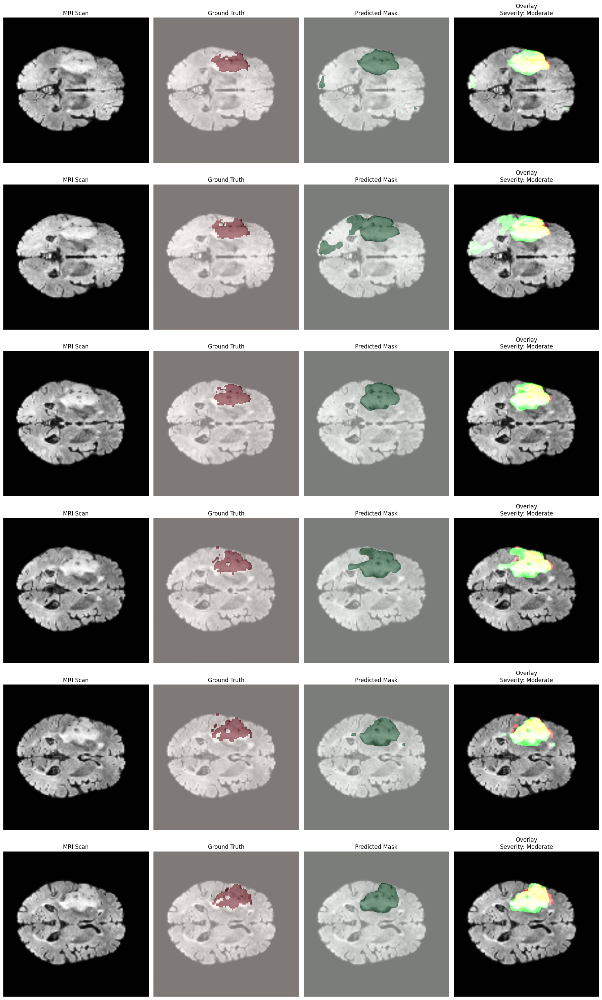

In [5]:
# ============================================================
# ADVANCED VISUALIZATION:
# MRI + GT MASK + PREDICTED MASK + SEVERITY
# ============================================================

import matplotlib.pyplot as plt
import numpy as np
import torch
import cv2

# ============================================================
# LESION SEVERITY FUNCTION
# ============================================================

def get_severity(mask):

    lesion_pixels = np.sum(mask)

    if lesion_pixels > 4000:
        return "Severe"

    elif lesion_pixels > 1500:
        return "Moderate"

    else:
        return "Mild"

# ============================================================
# COLOR OVERLAY FUNCTION
# ============================================================

def create_overlay(image, gt_mask, pred_mask):

    """
    GT MASK  -> RED
    PREDICT -> GREEN
    OVERLAP -> YELLOW
    """

    # Convert grayscale MRI to RGB
    image_rgb = np.stack([image]*3, axis=-1)

    # Normalize for display
    image_rgb = (
        image_rgb - image_rgb.min()
    ) / (
        image_rgb.max() - image_rgb.min() + 1e-8
    )

    overlay = image_rgb.copy()

    # --------------------------------------------------------
    # Ground Truth Mask -> RED
    # --------------------------------------------------------

    overlay[..., 0] = np.where(
        gt_mask > 0,
        1,
        overlay[..., 0]
    )

    # --------------------------------------------------------
    # Predicted Mask -> GREEN
    # --------------------------------------------------------

    overlay[..., 1] = np.where(
        pred_mask > 0,
        1,
        overlay[..., 1]
    )

    # --------------------------------------------------------
    # Overlap -> YELLOW
    # --------------------------------------------------------

    overlap = (gt_mask > 0) & (pred_mask > 0)

    overlay[..., 0] = np.where(
        overlap,
        1,
        overlay[..., 0]
    )

    overlay[..., 1] = np.where(
        overlap,
        1,
        overlay[..., 1]
    )

    return overlay

# ============================================================
# VISUALIZATION FUNCTION
# ============================================================

def visualize_predictions(model, dataset, device, num_samples=6):

    model.eval()

    plt.figure(figsize=(18, num_samples * 5))

    with torch.no_grad():

        for i in range(num_samples):

            # ------------------------------------------------
            # LOAD SAMPLE
            # ------------------------------------------------

            image, gt_mask = dataset[i]

            input_tensor = image.unsqueeze(0).to(device)

            # ------------------------------------------------
            # PREDICTION
            # ------------------------------------------------

            pred = model(input_tensor)

            pred = torch.sigmoid(pred)

            pred = (pred > 0.5).float()

            pred = pred.cpu().numpy()[0,0]

            # ------------------------------------------------
            # MORPHOLOGICAL CLEANUP
            # ------------------------------------------------

            kernel = np.ones((3,3), np.uint8)

            pred = cv2.morphologyEx(
                pred.astype(np.uint8),
                cv2.MORPH_OPEN,
                kernel
            )

            # ------------------------------------------------
            # NUMPY CONVERSION
            # ------------------------------------------------

            image_np = image.squeeze().cpu().numpy()

            gt_np = gt_mask.squeeze().cpu().numpy()

            # ------------------------------------------------
            # CREATE OVERLAY
            # ------------------------------------------------

            overlay = create_overlay(
                image_np,
                gt_np,
                pred
            )

            # ------------------------------------------------
            # DETERMINE SEVERITY
            # ------------------------------------------------

            severity = get_severity(pred)

            # ------------------------------------------------
            # DISPLAY MRI
            # ------------------------------------------------

            plt.subplot(num_samples, 4, i*4 + 1)

            plt.imshow(image_np, cmap='gray')

            plt.title("MRI Scan")

            plt.axis("off")

            # ------------------------------------------------
            # DISPLAY GROUND TRUTH
            # ------------------------------------------------

            plt.subplot(num_samples, 4, i*4 + 2)

            plt.imshow(image_np, cmap='gray')

            plt.imshow(
                gt_np,
                cmap='Reds',
                alpha=0.5
            )

            plt.title("Ground Truth")

            plt.axis("off")

            # ------------------------------------------------
            # DISPLAY PREDICTION
            # ------------------------------------------------

            plt.subplot(num_samples, 4, i*4 + 3)

            plt.imshow(image_np, cmap='gray')

            plt.imshow(
                pred,
                cmap='Greens',
                alpha=0.5
            )

            plt.title("Predicted Mask")

            plt.axis("off")

            # ------------------------------------------------
            # DISPLAY OVERLAY + SEVERITY
            # ------------------------------------------------

            plt.subplot(num_samples, 4, i*4 + 4)

            plt.imshow(overlay)

            plt.title(
                f"Overlay\nSeverity: {severity}"
            )

            plt.axis("off")

    plt.tight_layout()

    plt.show()

# ============================================================
# RUN VISUALIZATION
# ============================================================

visualize_predictions(
    model=model,
    dataset=test_dataset,
    device=device,
    num_samples=6
)

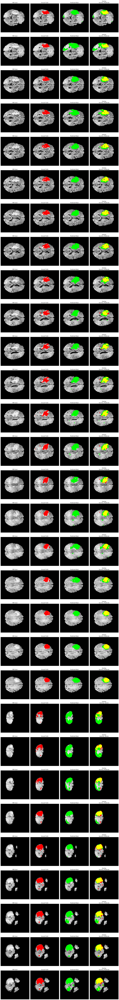

In [6]:
# ============================================================
# CLEAN VISUALIZATION:
# BLACK BACKGROUND + RED/GREEN MASKS
# ============================================================

import matplotlib.pyplot as plt
import numpy as np
import torch
import cv2

# ============================================================
# SEVERITY FUNCTION
# ============================================================

def get_severity(mask):

    lesion_pixels = np.sum(mask)

    if lesion_pixels > 4000:
        return "Severe"

    elif lesion_pixels > 1500:
        return "Moderate"

    else:
        return "Mild"

# ============================================================
# CREATE RGB MRI
# ============================================================

def to_rgb(image):

    image = (
        image - image.min()
    ) / (
        image.max() - image.min() + 1e-8
    )

    rgb = np.stack([image]*3, axis=-1)

    return rgb

# ============================================================
# GROUND TRUTH VISUALIZATION
# ============================================================

def create_gt_overlay(image, gt_mask):

    rgb = to_rgb(image)

    overlay = rgb.copy()

    # RED MASK
    overlay[gt_mask > 0] = [1, 0, 0]

    return overlay

# ============================================================
# PREDICTION VISUALIZATION
# ============================================================

def create_pred_overlay(image, pred_mask):

    rgb = to_rgb(image)

    overlay = rgb.copy()

    # GREEN MASK
    overlay[pred_mask > 0] = [0, 1, 0]

    return overlay

# ============================================================
# FINAL OVERLAY
# ============================================================

def create_final_overlay(image, gt_mask, pred_mask):

    rgb = to_rgb(image)

    overlay = rgb.copy()

    # --------------------------------------------------------
    # GROUND TRUTH -> RED
    # --------------------------------------------------------

    overlay[gt_mask > 0] = [1, 0, 0]

    # --------------------------------------------------------
    # PREDICTION -> GREEN
    # --------------------------------------------------------

    overlay[pred_mask > 0] = [0, 1, 0]

    # --------------------------------------------------------
    # OVERLAP -> YELLOW
    # --------------------------------------------------------

    overlap = (
        (gt_mask > 0) &
        (pred_mask > 0)
    )

    overlay[overlap] = [1, 1, 0]

    return overlay

# ============================================================
# MAIN VISUALIZATION FUNCTION
# ============================================================

def visualize_predictions(
    model,
    dataset,
    device,
    num_samples=6
):

    model.eval()

    plt.figure(figsize=(18, num_samples * 5))

    with torch.no_grad():

        for i in range(num_samples):

            # ------------------------------------------------
            # LOAD SAMPLE
            # ------------------------------------------------

            image, gt_mask = dataset[i]

            input_tensor = image.unsqueeze(0).to(device)

            # ------------------------------------------------
            # PREDICTION
            # ------------------------------------------------

            pred = model(input_tensor)

            pred = torch.sigmoid(pred)

            pred = (pred > 0.3).float()

            pred = pred.cpu().numpy()[0,0]

            # ------------------------------------------------
            # MORPHOLOGICAL CLEANUP
            # ------------------------------------------------

            kernel = np.ones((3,3), np.uint8)

            pred = cv2.morphologyEx(
                pred.astype(np.uint8),
                cv2.MORPH_OPEN,
                kernel
            )

            # ------------------------------------------------
            # NUMPY
            # ------------------------------------------------

            image_np = image.squeeze().cpu().numpy()

            gt_np = gt_mask.squeeze().cpu().numpy()

            # ------------------------------------------------
            # CREATE VISUALS
            # ------------------------------------------------

            gt_overlay = create_gt_overlay(
                image_np,
                gt_np
            )

            pred_overlay = create_pred_overlay(
                image_np,
                pred
            )

            final_overlay = create_final_overlay(
                image_np,
                gt_np,
                pred
            )

            # ------------------------------------------------
            # SEVERITY
            # ------------------------------------------------

            severity = get_severity(pred)

            # =================================================
            # DISPLAY MRI
            # =================================================

            plt.subplot(num_samples, 4, i*4 + 1)

            plt.imshow(
                image_np,
                cmap='gray'
            )

            plt.title("MRI Scan")

            plt.axis("off")

            # =================================================
            # DISPLAY GROUND TRUTH
            # =================================================

            plt.subplot(num_samples, 4, i*4 + 2)

            plt.imshow(gt_overlay)

            plt.title("Ground Truth")

            plt.axis("off")

            # =================================================
            # DISPLAY PREDICTION
            # =================================================

            plt.subplot(num_samples, 4, i*4 + 3)

            plt.imshow(pred_overlay)

            plt.title("Predicted Mask")

            plt.axis("off")

            # =================================================
            # DISPLAY FINAL OVERLAY
            # =================================================

            plt.subplot(num_samples, 4, i*4 + 4)

            plt.imshow(final_overlay)

            plt.title(
                f"Overlay\nSeverity: {severity}"
            )

            plt.axis("off")

    plt.tight_layout()

    plt.show()

# ============================================================
# RUN VISUALIZATION
# ============================================================

visualize_predictions(
    model=model,
    dataset=test_dataset,
    device=device,
    num_samples=30
)

In [12]:
# ============================================================
# ISCHEMIC LESION SEGMENTATION
# Training / Validation Curves + Testing Metrics
# Confusion Matrix Visualization
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# ============================================================
# 1. TRAINING & VALIDATION CURVES
# ============================================================

# history = model.fit(...) output

plt.figure(figsize=(8,5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')

plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


# ============================================================
# DICE CURVE
# ============================================================

# Replace with your metric name if different
# Examples:
# history.history['dice_coef']
# history.history['val_dice_coef']

plt.figure(figsize=(8,5))
plt.plot(history.history['dice_coef'], label='Training Dice')
plt.plot(history.history['val_dice_coef'], label='Validation Dice')

plt.title('Training vs Validation Dice Score')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.legend()
plt.grid(True)
plt.show()


# ============================================================
# 2. TESTING PERFORMANCE
# ============================================================

# Predict on test set
y_pred = model.predict(X_test)

# Convert probabilities to binary mask
y_pred_bin = (y_pred > 0.5).astype(np.uint8)

# Flatten masks
y_true_flat = y_test.flatten()
y_pred_flat = y_pred_bin.flatten()

# ============================================================
# 3. CONFUSION MATRIX
# ============================================================

cm = confusion_matrix(y_true_flat, y_pred_flat)

plt.figure(figsize=(6,5))

sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=['Background', 'Lesion'],
    yticklabels=['Background', 'Lesion']
)

plt.title('Confusion Matrix - Ischemic Lesion Segmentation')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# ============================================================
# 4. CLASSIFICATION REPORT
# ============================================================

print("\nClassification Report:\n")

print(
    classification_report(
        y_true_flat,
        y_pred_flat,
        target_names=['Background', 'Lesion']
    )
)


# ============================================================
# 5. TESTING CURVE / SAMPLE VISUALIZATION
# ============================================================

# Display sample predictions

num_samples = 3

for i in range(num_samples):

    plt.figure(figsize=(15,5))

    # Original MRI
    plt.subplot(1,3,1)
    plt.imshow(X_test[i].squeeze(), cmap='gray')
    plt.title("MRI Image")
    plt.axis('off')

    # Ground Truth
    plt.subplot(1,3,2)
    plt.imshow(y_test[i].squeeze(), cmap='gray')
    plt.title("Ground Truth Mask")
    plt.axis('off')

    # Predicted Mask
    plt.subplot(1,3,3)
    plt.imshow(y_pred_bin[i].squeeze(), cmap='gray')
    plt.title("Predicted Mask")
    plt.axis('off')

    plt.show()


# ============================================================
# 6. OPTIONAL: IOU & DICE SCORE
# ============================================================

def dice_score(y_true, y_pred):

    smooth = 1e-6

    intersection = np.sum(y_true * y_pred)

    return (
        (2. * intersection + smooth)
        /
        (np.sum(y_true) + np.sum(y_pred) + smooth)
    )


def iou_score(y_true, y_pred):

    smooth = 1e-6

    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection

    return (
        (intersection + smooth)
        /
        (union + smooth)
    )


dice = dice_score(y_true_flat, y_pred_flat)
iou = iou_score(y_true_flat, y_pred_flat)

print(f"\nDice Score : {dice:.4f}")
print(f"IoU Score  : {iou:.4f}")

NameError: name 'history' is not defined

<Figure size 800x500 with 0 Axes>